# <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#0e92ea;text-align:center">                      Project: ReCell Used phone prediction<br>
    By: Syeda Ambreen Karim Bokhari

## <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#0e92ea">Problem Statement

## Background: 
Buying and selling used smartphones used to be something that happened on a handful of online marketplace sites. But the used and refurbished phone market has grown considerably over the past decade, and a new IDC (International Data Corporation) forecast predicts that the used phone market would be worth $52.7bn by 2023 with a compound annual growth rate (CAGR) of 13.6% from 2018 to 2023. This growth can be attributed to an uptick in demand for used smartphones that offer considerable savings compared with new models.
Refurbished and used devices continue to provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing a smartphone. There are plenty of other benefits associated with the used smartphone market.

## Data Dictionary:

• brand_name: Name of manufacturing brand<br>
• os: OS on which the phone runs<br>
• screen_size: Size of the screen in cm<br>
• 4g: Whether 4G is available or not<br>
• 5g: Whether 5G is available or not<br>
• main_camera_mp: Resolution of the rear camera in megapixels<br>
• selfie_camera_mp: Resolution of the front camera in megapixels<br>
• int_memory: Amount of internal memory (ROM) in GB<br>
• ram: Amount of RAM in GB<br>
• battery: Energy capacity of the phone battery in mAh<br>
• weight: Weight of the phone in grams<br>
• release_year: Year when the phone model was released<br>
• days_used: Number of days the used/refurbished phone has been used<br>
• new_price: Price of a new phone of the same model in euros<br>
• used_price: Price of the used/refurbished phone in euros<br>

### <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#0e92ea"> Objective:
    
We need to create an ML-based solution to develop a dynamic pricing strategy for used and refurbished smartphones.


- To analyze the data provided and build a linear regression model <br>
- To predict the price of a used phone.<br>
- identify factors that significantly influence it.<br>
    
    
   We need to Explore the dataset and extract insights from the data to answer the following questions:<br>
1. Refurbished and used devices continue to provide cost-effective alternatives to both consumers and businesses that are looking to save money when purchasing a smartphone.
2. Used and refurbished devices can be sold with warranties and can also be insured with proof of purchase.
3.Third-party vendors/platforms, such as Verizon, Amazon, etc., provide attractive offers to customers for refurbished smartphones. 
4.Maximizing the longevity of mobile phones through second-hand trade also reduces their environmental impact and helps in recycling and reducing waste.
5. The impact of the COVID-19 outbreak may further boost the cheaper refurbished smartphone segment, as consumers cut back on discretionary spending and buy phones only for immediate needs.

## Importing necessary libraries and data

In [1]:
import warnings
warnings.filterwarnings("ignore")

In [2]:
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd

# Libraries to help with data visualization
import matplotlib.pyplot as plt
import seaborn as sns

sns.set()

# split the data into train and test
from sklearn.model_selection import train_test_split

# to build linear regression_model
from sklearn.linear_model import LinearRegression

# to check model performance
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [3]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

## Importing Data

In [4]:
cell=pd.read_csv("used_phone_data.csv")
data=cell.copy
np.random.seed(1)
cell.sample(n=10)

,brand_name,os,screen_size,4g,5g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2501,Samsung,Android,13.49,yes,no,13.0,13.0,32.0,4.00,3600.0,181.0,2017,683,198.680,79.47
2782,Sony,Android,13.81,yes,no,NaN,8.0,32.0,4.00,3300.0,156.0,2019,195,198.150,149.10
605,Others,Android,12.70,yes,no,8.0,5.0,16.0,4.00,2400.0,137.0,2015,1048,161.470,48.39
2923,Vivo,Android,19.37,yes,no,13.0,16.0,64.0,4.00,3260.0,149.3,2019,375,211.880,138.31
941,Others,Others,5.72,no,no,0.3,0.3,32.0,0.25,820.0,90.0,2013,883,29.810,8.92
1833,LG,Android,13.49,no,no,8.0,1.3,32.0,4.00,3140.0,161.0,2013,670,240.540,96.18
671,Apple,iOS,14.92,yes,no,12.0,7.0,64.0,4.00,5493.0,48.0,2018,403,700.150,350.08
1796,LG,Android,17.78,yes,no,5.0,0.3,16.0,4.00,4000.0,294.8,2014,708,189.300,75.94
757,Asus,Android,13.49,yes,no,13.0,8.0,32.0,4.00,5000.0,181.0,2017,612,270.500,108.13
3528,Realme,Android,15.72,yes,no,NaN,16.0,64.0,4.00,4035.0,184.0,2019,433,159.885,80.00


## Data Overview

- Shape
- Missing values
- Duplicate values
- Descriptive data summary

In [5]:
cell.shape

(3571, 15)

In [6]:
cell.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   brand_name        3571 non-null   object 
 1   os                3571 non-null   object 
 2   screen_size       3571 non-null   float64
 3   4g                3571 non-null   object 
 4   5g                3571 non-null   object 
 5   main_camera_mp    3391 non-null   float64
 6   selfie_camera_mp  3569 non-null   float64
 7   int_memory        3561 non-null   float64
 8   ram               3561 non-null   float64
 9   battery           3565 non-null   float64
 10  weight            3564 non-null   float64
 11  release_year      3571 non-null   int64  
 12  days_used         3571 non-null   int64  
 13  new_price         3571 non-null   float64
 14  used_price        3571 non-null   float64
dtypes: float64(9), int64(2), object(4)
memory usage: 418.6+ KB


In [7]:
cell.isnull().sum()

brand_name            0
os                    0
screen_size           0
4g                    0
5g                    0
main_camera_mp      180
selfie_camera_mp      2
int_memory           10
ram                  10
battery               6
weight                7
release_year          0
days_used             0
new_price             0
used_price            0
dtype: int64

<u><b>Observations:</b></u><br>
There are missing values in the following columns:<br>
1. main_camera_mp  :     180<br>
2. selfie_camera_mp  :    2<br>
3. int_memory       :    10<br>
4. ram             :     10<br>
5. battery         :      6<br>
6. weight          :      7<br>
- main_camera_mp has the most 180 missing values
- int_mamory and ram columns have same number of missing values, they may be related. 

In [8]:
# duplicate values check
cell.duplicated().sum()

0

- There are no duplicate rows.

In [9]:
# count of all variavle data types
cell.dtypes.value_counts()

float64    9
object     4
int64      2
dtype: int64

- 11 numeric and 4 categorical variables.

In [10]:
# check for number of unique values in the variables
cell.nunique()

brand_name            34
os                     4
screen_size          127
4g                     2
5g                     2
main_camera_mp        44
selfie_camera_mp      37
int_memory            16
ram                   14
battery              354
weight               613
release_year           8
days_used            930
new_price           3099
used_price          3044
dtype: int64

- The data is about cell phones from 34 different brands. four operating systems. 4g and 5g are binary. Data span is eight years.

## <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#0e92ea">Exploratory Data Analysis

In [11]:
# Let's look at the statistical summary of the data
pd.set_option(
    "display.float_format", lambda x: "%.3f" % x
)  # to display numbers rounded off to 3 decimal places

cell.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
os,3571,4,Android,3246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.000,NaN,NaN,NaN,14.804,5.153,2.700,12.700,13.490,16.510,46.360
4g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3391.000,NaN,NaN,NaN,9.400,4.818,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3569.000,NaN,NaN,NaN,6.547,6.879,0.300,2.000,5.000,8.000,32.000
int_memory,3561.000,NaN,NaN,NaN,54.533,84.696,0.005,16.000,32.000,64.000,1024.000
ram,3561.000,NaN,NaN,NaN,4.057,1.392,0.030,4.000,4.000,4.000,16.000
battery,3565.000,NaN,NaN,NaN,3067.226,1364.207,80.000,2100.000,3000.000,4000.000,12000.000


- Data is about phones from 34 different brands and 4 different operating systems.4g and 5g are yes/no.
- release_year: 2013 - 2020, eight year data of cell phones.
- bettery: mean: 3067.225 and median:3000 are quite close. min: 80, max: 12000, big difference, std; ~1364
- weight:  mean: 179.42 and median:159 are quite close. min: 23, max: 950, big difference, big std; ~90.3
- days_used:  mean: 675.4 and median:690 are quite close. min: 91, max:1094 , big difference, big std; 248.64
- new_price:  mean: 237.4 and median:189.8 are quite close. min:9.13 , max: 2560, big difference, big std; 197.55
- used_price:  mean: 109.9 and median:75.53 are quite different. min: 2.51, max: 1916.54, big difference, big std; 121.5
- In main_camera_mp Minimum 0.080 and maximum is 48 but There is not much difference between mean and median of main_camera_mp, so we can replace the missing values with the mean
    + int_memory : mean is pulled towards the larger extreme may be due to larger outlier.Mininum is very small 0.005, maximum is comparatively larger: 1024, median is 32 and mean is ~84.7, missing values may be replaced by median.
    + ram: mean is 4.057 which is close to median 4, minimum is 0.0300 and maximum is 16. may have some outliers. missing values may be replaced with mean. 
- Missing values in selfie_camera_mp : 2, battery : 6 and weight : 7 are few rows  so they can be dropped.
- Missing values in ram : 10, int_memory : 10 may have some pattern.


## Data Preprocessing

- Missing value treatment
- Feature engineering (if needed)
- Outlier detection and treatment (if needed)
- Preparing data for modeling
- Any other preprocessing steps (if needed)

In [12]:
import pandas_profiling
pandas_profiling.ProfileReport(cell)

### Unique values in Categorical data

In [13]:
# looking at value counts for non-numeric features

num_to_display = 20  # defining this up here so it's easy to change later if I want
for colname in cell.dtypes[cell.dtypes == 'object'].index:
    val_counts = cell[colname].value_counts(dropna=False)  # i want to see NA counts
    print(val_counts[:num_to_display])
    if len(val_counts) > num_to_display:
        print(f'Only displaying first {num_to_display} of {len(val_counts)} values.')
    print('\n\n') # just for more space between 

Others      509
Samsung     364
Huawei      264
LG          212
Lenovo      172
ZTE         141
Xiaomi      134
Oppo        129
Asus        126
Alcatel     125
Nokia       121
Micromax    120
Honor       118
Vivo        117
Motorola    110
HTC         110
Sony         88
Meizu        62
Apple        59
Gionee       56
Name: brand_name, dtype: int64
Only displaying first 20 of 34 values.



Android    3246
Others      202
Windows      67
iOS          56
Name: os, dtype: int64



yes    2359
no     1212
Name: 4g, dtype: int64



no     3419
yes     152
Name: 5g, dtype: int64





In [14]:
cell = cell.rename({"4g":"four_g","5g":"five_g"}, axis='columns')
cell.head()

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
0,Honor,Android,23.970,yes,no,13.000,5.000,64.000,3.000,3020.000,146.000,2020,127,111.620,86.960
1,Honor,Android,28.100,yes,yes,13.000,16.000,128.000,8.000,4300.000,213.000,2020,325,249.390,161.490
2,Honor,Android,24.290,yes,yes,13.000,8.000,128.000,8.000,4200.000,213.000,2020,162,359.470,268.550
3,Honor,Android,26.040,yes,yes,13.000,8.000,64.000,6.000,7250.000,480.000,2020,345,278.930,180.230
4,Honor,Android,15.720,yes,no,13.000,8.000,64.000,3.000,5000.000,185.000,2020,293,140.870,103.800


In [15]:
# Make catagorical variable into catagory.
cell['brand_name']=cell.brand_name.astype('category')
cell['os']=cell.os.astype('category')
cell['four_g']=cell.four_g.astype('category')
cell['five_g']=cell.five_g.astype('category')
#cell['release_year']=cell.release_year.astype('category')

In [16]:
cell.sort_values(by='battery', ascending=False).head(10)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
387,Samsung,Android,43.660,yes,no,12.000,5.000,64.000,3.000,12000.000,23.000,2019,266,659.470,460.580
401,Apple,Others,31.910,yes,no,12.000,7.000,128.000,6.000,9720.000,641.000,2020,220,999.580,749.840
666,Apple,iOS,31.910,yes,no,12.000,7.000,1024.000,4.000,9720.000,631.000,2018,543,1100.860,550.400
1647,Lenovo,Android,25.560,yes,no,8.000,1.600,16.000,4.000,9600.000,619.000,2014,723,300.610,120.290
1646,Lenovo,Android,33.500,yes,no,8.000,1.600,32.000,4.000,9600.000,950.000,2014,1085,409.190,122.830
2691,Samsung,Android,30.800,no,no,8.000,2.000,32.000,4.000,9500.000,732.000,2014,799,469.180,187.650
2690,Samsung,Android,30.800,yes,no,8.000,2.000,32.000,4.000,9500.000,740.000,2014,921,499.550,149.850
2689,Samsung,Android,30.800,no,no,8.000,2.000,32.000,4.000,9500.000,750.000,2014,689,538.780,215.540
2688,Samsung,Android,30.800,no,no,8.000,2.000,32.000,4.000,9500.000,753.000,2014,1078,641.130,192.390
2687,Samsung,Android,30.800,yes,no,8.000,2.000,32.000,4.000,9500.000,753.000,2014,1089,669.490,200.760


In [17]:
cell.sort_values(by='battery').head(10)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
1383,Huawei,Others,3.180,no,no,12.500,5.000,16.000,0.250,80.000,35.000,2016,643,197.400,79.000
1323,Huawei,Others,2.860,no,no,13.000,8.000,128.000,0.250,178.000,32.500,2018,610,149.370,59.840
690,Apple,iOS,3.330,no,no,12.000,6.000,32.000,4.000,205.000,25.000,2016,811,271.230,81.280
700,Apple,iOS,3.330,no,no,8.000,1.200,32.000,4.000,205.000,40.000,2014,590,648.510,324.180
702,Apple,iOS,3.330,no,no,8.000,1.200,32.000,4.000,205.000,25.000,2014,541,247.700,123.840
520,Alcatel,Others,6.030,no,no,5.000,2.000,16.000,4.000,210.000,142.950,2015,554,110.970,55.630
2841,Sony,Android,3.490,no,no,8.100,2.000,16.000,4.000,225.000,122.500,2013,890,80.180,24.090
2449,Samsung,Others,2.700,no,no,12.000,9.000,16.000,4.000,230.000,25.000,2019,337,251.640,163.100
1700,LG,Android,2.860,no,no,13.000,5.000,16.000,4.000,240.000,79.000,2018,598,260.450,130.100
1721,LG,Android,2.860,no,no,13.000,5.000,16.000,4.000,240.000,46.000,2017,810,171.040,51.270


battery has a very high maximum value but there may be many rows that have high battery values, lets check lowest battery values

In [18]:
cell.sort_values(by='screen_size', ascending=False).head(20)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2562,Samsung,Android,46.360,yes,no,2.100,5.000,32.000,4.000,5700.000,65.000,2015,627,639.870,255.730
387,Samsung,Android,43.660,yes,no,12.000,5.000,64.000,3.000,12000.000,23.000,2019,266,659.470,460.580
1646,Lenovo,Android,33.500,yes,no,8.000,1.600,32.000,4.000,9600.000,950.000,2014,1085,409.190,122.830
204,Xiaomi,Android,32.390,yes,yes,12.000,20.000,512.000,12.000,4050.000,241.000,2019,478,2498.240,1248.990
666,Apple,iOS,31.910,yes,no,12.000,7.000,1024.000,4.000,9720.000,631.000,2018,543,1100.860,550.400
680,Apple,iOS,31.910,yes,no,12.000,7.000,64.000,4.000,2256.000,677.000,2017,541,900.630,450.350
401,Apple,Others,31.910,yes,no,12.000,7.000,128.000,6.000,9720.000,641.000,2020,220,999.580,749.840
697,Apple,iOS,31.910,yes,no,8.000,1.200,32.000,4.000,3937.000,713.000,2015,572,849.520,424.880
1194,Others,Android,31.430,no,no,8.000,2.000,16.000,4.000,5900.000,350.000,2015,976,389.790,117.070
1472,Others,Others,31.270,no,no,5.000,2.000,32.000,4.000,4450.000,384.000,2014,767,170.810,68.370


- very big screen sizes at the upper end, 30-46cm, too big to be a cell phone specification.

In [19]:
cell.sort_values(by='screen_size').head(10)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2449,Samsung,Others,2.700,no,no,12.000,9.000,16.000,4.000,230.000,25.000,2019,337,251.640,163.100
388,Samsung,Others,2.860,no,no,13.000,8.000,4.000,0.750,300.000,172.000,2017,853,198.570,59.480
2567,Samsung,Others,2.860,no,no,8.000,5.000,16.000,4.000,250.000,42.000,2015,981,270.570,81.270
1721,LG,Android,2.860,no,no,13.000,5.000,16.000,4.000,240.000,46.000,2017,810,171.040,51.270
1336,Huawei,Android,2.860,yes,no,13.000,8.000,16.000,4.000,420.000,57.000,2018,414,269.200,134.680
2569,Samsung,Others,2.860,no,no,8.000,5.000,16.000,4.000,300.000,51.000,2015,604,301.160,120.460
2553,Samsung,Others,2.860,no,no,12.000,5.000,16.000,4.000,300.000,54.000,2016,829,300.100,89.910
1700,LG,Android,2.860,no,no,13.000,5.000,16.000,4.000,240.000,79.000,2018,598,260.450,130.100
2568,Samsung,Others,2.860,no,no,8.000,5.000,16.000,4.000,250.000,47.000,2015,918,220.630,66.240
1357,Huawei,Android,2.860,yes,no,8.000,8.000,16.000,4.000,420.000,64.000,2017,633,330.270,132.150


- very small screen sizes at the lower end, 2.7cm the smallest, The data may be erronous.

###  Sanity checks
After googling about cell phones i came to know that:<br>
Smallest screen size in dumb phone was 1.7 inches, which is 4.32 cm<br>
Smallest screen size in smart phone i found was 3 inch which is 7.62 cm<br>
Biggest screen size which i found was 8.01-inch a fold phone which is 20.35 inches <br>
The cell phone above 20.35 inches and below 1.7 inches these ranges may not have the correct screen_size given.

In [20]:
cell.columns

Index(['brand_name', 'os', 'screen_size', 'four_g', 'five_g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price'],
      dtype='object')

## Exploratory Data Analysis (EDA)

- EDA is an important part of any project involving data.
- It is important to investigate and understand the data better before building a model with it.
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
- A thorough analysis of the data, in addition to the questions mentioned below, should be done.

**Questions**:

1. What does the distribution of used phone prices look like?
2. What percentage of the used phone market is dominated by Android devices?
3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?
4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?
5. Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?
6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?
7. Which attributes are highly correlated with the used phone price?

In [21]:
# Function to create barplots that indicate percentage for each category.
def bar_perc(plot, feature):
    '''
    plot
    feature: 1-d categorical feature array
    '''
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage

In [22]:
def dist_box_violin(data):
 # function plots a combined graph for univariate analysis of continous variable 
 #to check spread, central tendency , dispersion and outliers  
    Name=data.name.upper()
    fig, axes =plt.subplots(1,3,figsize=(17, 7))
    fig.suptitle("SPREAD OF DATA FOR "+ Name  , fontsize=18, fontweight='bold')
    sns.distplot(data,kde=False,color='Blue',ax=axes[0])
    axes[0].axvline(data.mean(), color='y', linestyle='--',linewidth=2)
    axes[0].axvline(data.median(), color='r', linestyle='dashed', linewidth=2)
    axes[0].axvline(data.mode()[0],color='g',linestyle='solid',linewidth=2)
    axes[0].legend({'Mean':data.mean(),'Median':data.median(),'Mode':data.mode()})
    sns.boxplot(x=data,showmeans=True, orient='h',color="purple",ax=axes[1])
    #just exploring violin plot
    sns.violinplot(data,ax=axes[2],showmeans=True)

## Univariate Analysis of Numeric Variables

#### Q1. What does the distribution of used phone prices look like?

In [23]:
cell.used_price.describe(include='all')

count   3571.000
mean     109.880
std      121.501
min        2.510
25%       45.205
50%       75.530
75%      126.000
max     1916.540
Name: used_price, dtype: float64

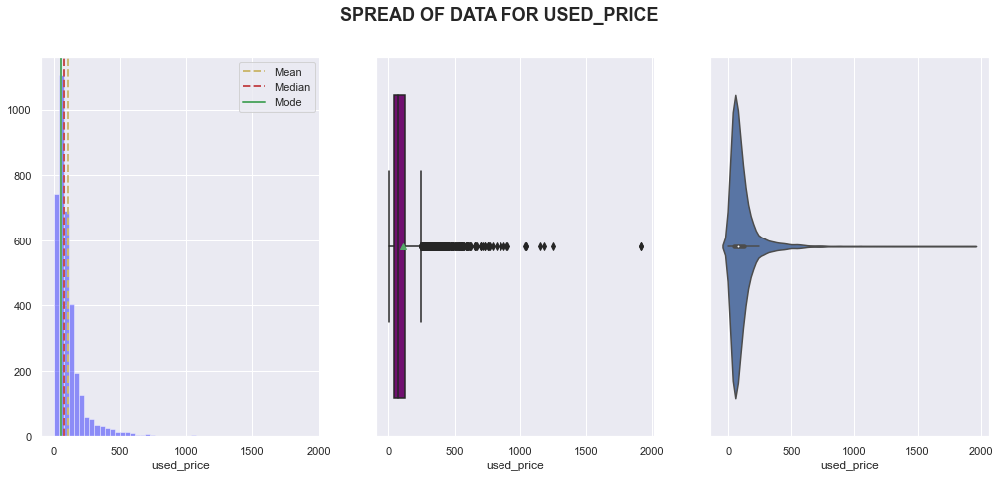

In [24]:

dist_box_violin(cell.used_price)

**Observations**

* It is the target variable.
* The distribution of used_price is heavily skewed to the right.
* The outliers to the right indicate that many cell phones, though used,  have a very high Prices.
* Mean is 109.9 much greater than median due to extreme values towards higher end.
* There are a lot of outliers towards right, larger side.Majority of values 50% are between 45 and 126

In [25]:
cell.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
os,3571,4,Android,3246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.000,NaN,NaN,NaN,14.804,5.153,2.700,12.700,13.490,16.510,46.360
four_g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
five_g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3391.000,NaN,NaN,NaN,9.400,4.818,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3569.000,NaN,NaN,NaN,6.547,6.879,0.300,2.000,5.000,8.000,32.000
int_memory,3561.000,NaN,NaN,NaN,54.533,84.696,0.005,16.000,32.000,64.000,1024.000
ram,3561.000,NaN,NaN,NaN,4.057,1.392,0.030,4.000,4.000,4.000,16.000
battery,3565.000,NaN,NaN,NaN,3067.226,1364.207,80.000,2100.000,3000.000,4000.000,12000.000


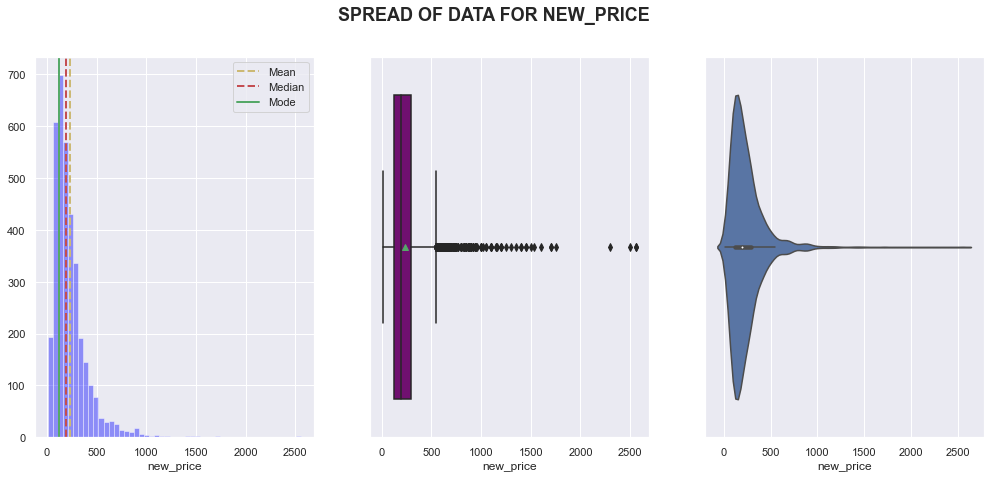

In [26]:

dist_box_violin(cell.new_price)

**Observations**

* The distribution of new_price is heavily skewed to the right, similar to used_price
* The outliers to the right indicate that many cell phones, though used,  have a very high Prices.
* Mean is 237.4 much greater than median 189.8, due to extreme values towards higher end.
* There are a lot of outliers towards right, larger side.Majority of values 50% are between 120.13	and291.94

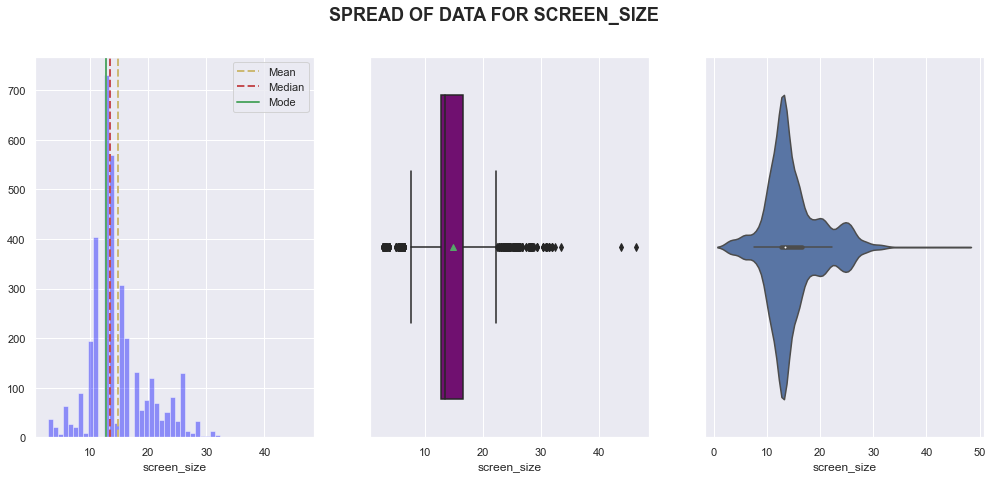

In [27]:

dist_box_violin(cell.screen_size)

* The distribution looks somewhat towards normal but is a bit right skewed. There are some very high values for a mobile screen size. 
* There are a lot of outliers on both upper and lower extremes. 
* This variable may need feature engineering.

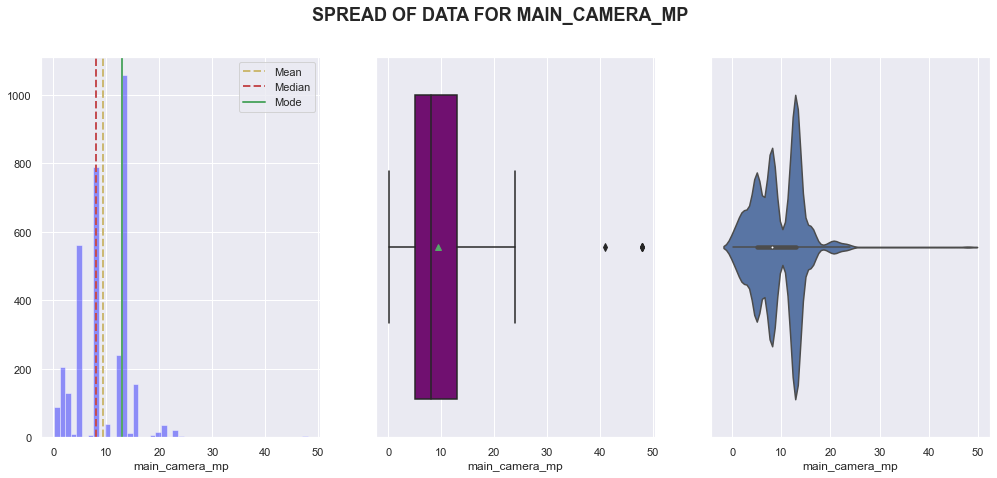

In [28]:
list_col_n=['main_camera_mp','selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used']
dist_box_violin(cell.main_camera_mp)

* The distribution is not very normal, it has 3 peaks. a few outliers are also present towards higher end.

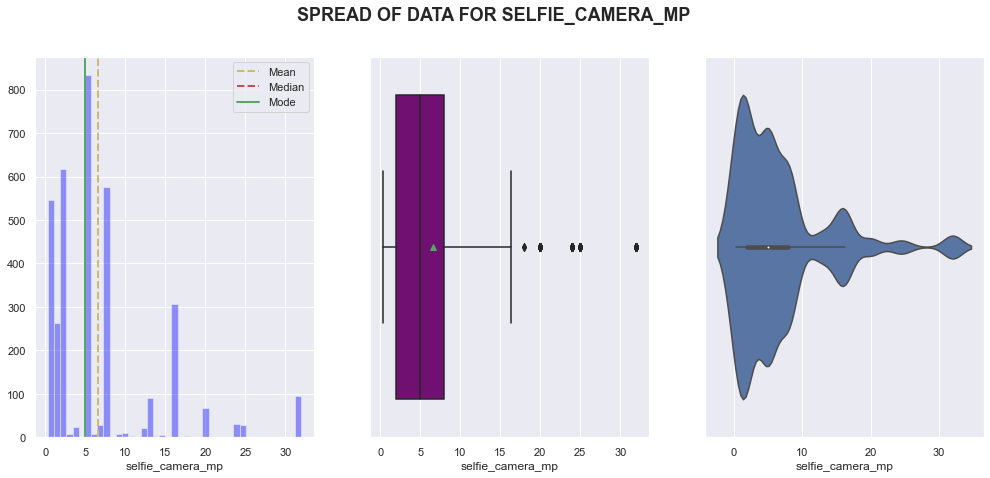

In [29]:
dist_box_violin(cell.selfie_camera_mp)

* The distribution is somewhat right skewed indicating the presence of outliers on the upper end. 
*It has some missing values. 
*It will need feature engineering. 

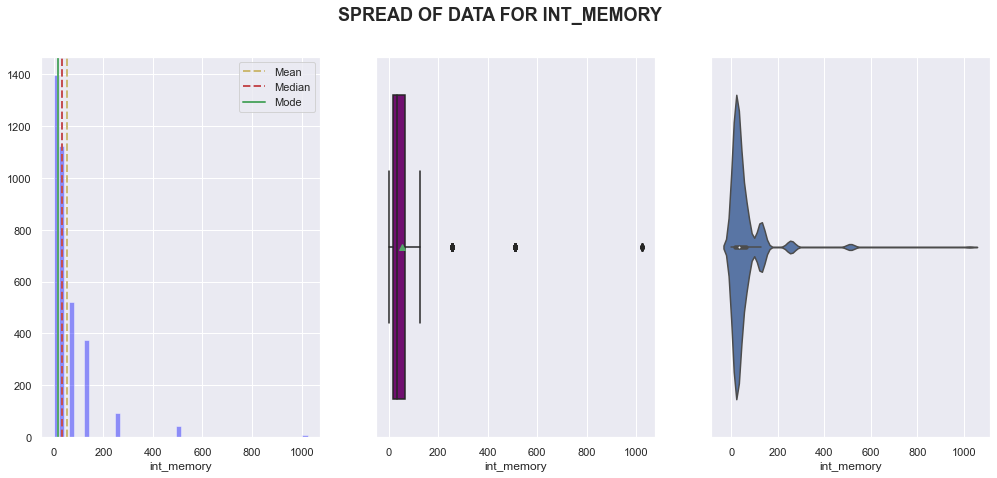

In [30]:
dist_box_violin(cell.int_memory)

* The distribution is highly right skewed indicating the presence of outliers on the upper end. 
* It has some missing values. 
* IQR is very small so the box is very thin in boxplot.
* It will need feature engineering. 

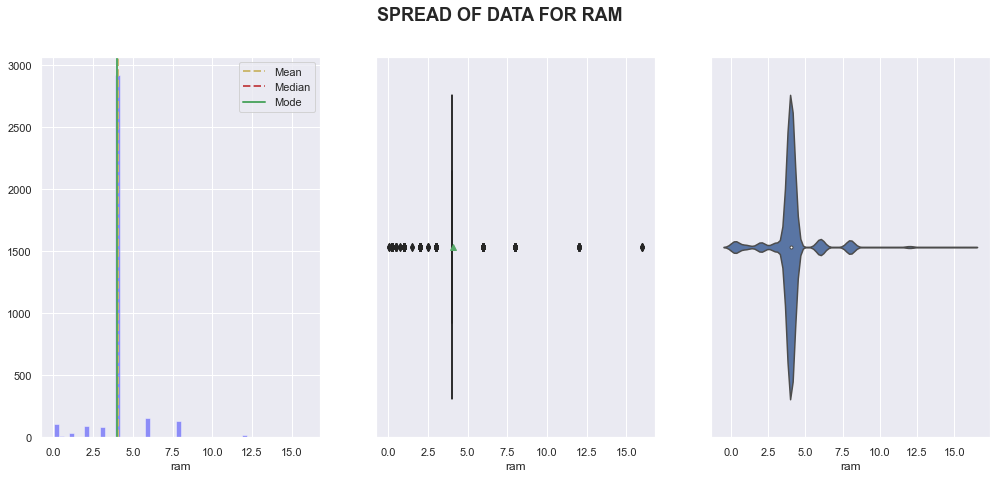

In [31]:
dist_box_violin(cell.ram)

* The distribution is unimodal with a very high peak at 4, indicating majority of values are ~4. 
* The presence of outliers on both the ends shows some variance. Which seems to be important. 
* It has some missing values. 
* It will need feature engineering. 

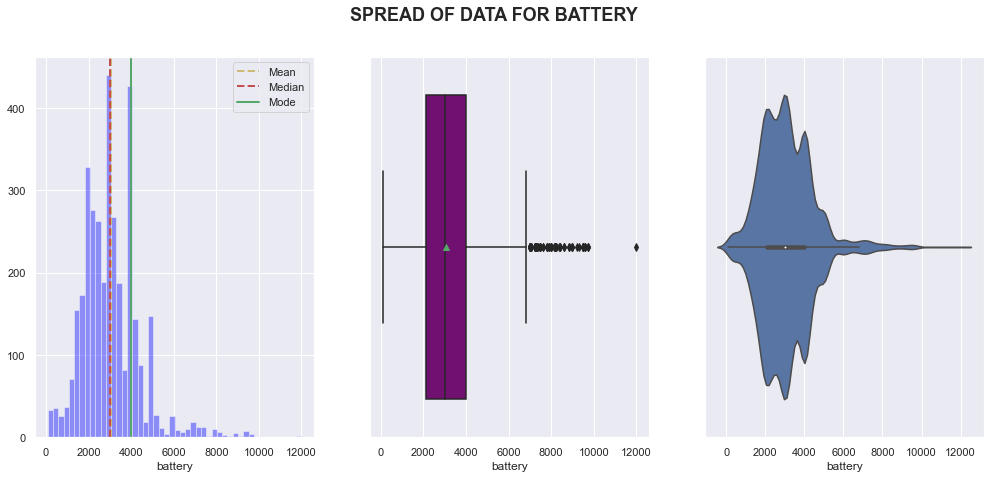

In [32]:
dist_box_violin(cell.battery)

* The distribution is somewhat right skewed indicating the presence of outliers on the upper end. 
*It has some missing values. 
*It will need feature engineering. 

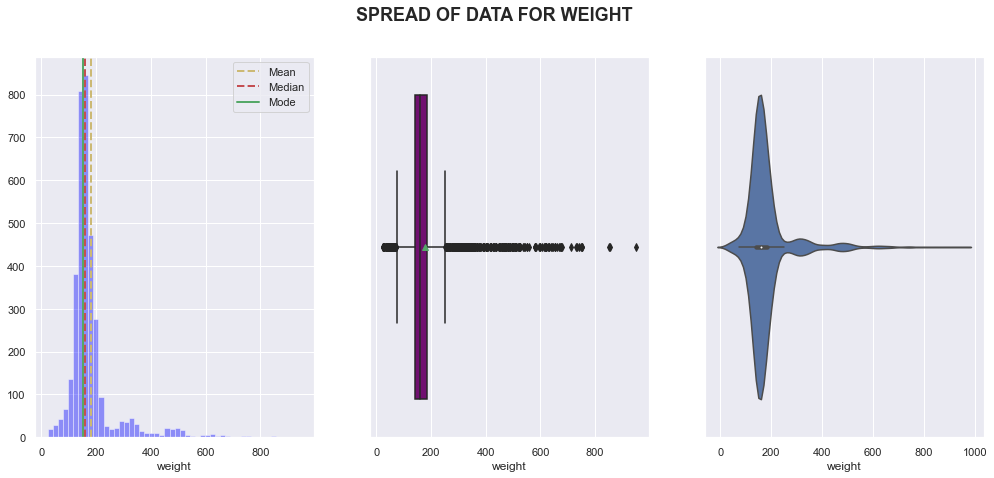

In [33]:
dist_box_violin(cell.weight)

* The distribution is somewhat right skewed indicating the presence of outliers on the upper end. 
*It has some missing values. 
*It will need feature engineering. 

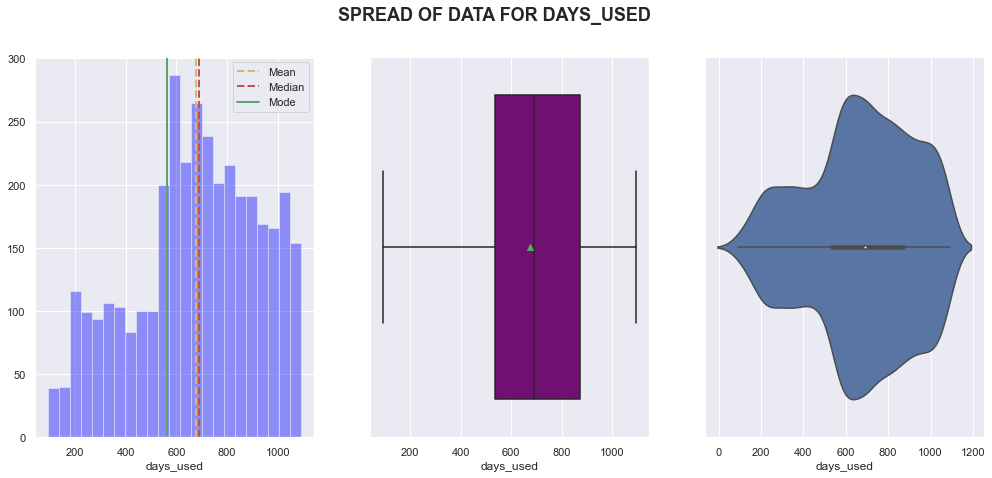

In [34]:
dist_box_violin(cell.days_used)

* The distribution is somewhat uniform, indicating the absence of outliers on both the ends.  

## Univariate Analysis of Categorical Variables

In [35]:
# function to create labeled barplots


def labeled_barplot(data, feature, perc=False, n=None):
    """
    Barplot with percentage at the top

    data: dataframe
    feature: dataframe column
    perc: whether to display percentages instead of count (default is False)
    n: displays the top n category levels (default is None, i.e., display all levels)
    """
    
    total = len(data[feature])  # length of the column
    count = data[feature].nunique()
    if n is None:
        plt.figure(figsize=(count + 1, 5))
    else:
        plt.figure(figsize=(n + 1, 5))

    plt.xticks(rotation=90, fontsize=15)
    ax = sns.countplot(
        data=data,
        x=feature,
        palette="Paired",
        order=data[feature].value_counts().index[:n].sort_values(),
        )

    for p in ax.patches:
        if perc == True:
            label = "{:.1f}%".format(
                100 * p.get_height() / total
            )  # percentage of each class of the category
        else:
            label = p.get_height()  # count of each level of the category

        x = p.get_x() + p.get_width() / 2  # width of the plot
        y = p.get_height()  # height of the plot

        ax.annotate(
            label,
            (x, y),
            ha="center",
            va="center",
            size=12,
            xytext=(0, 5),
            textcoords="offset points",
        )  # annotate the percentage

    plt.show()  # show the plot

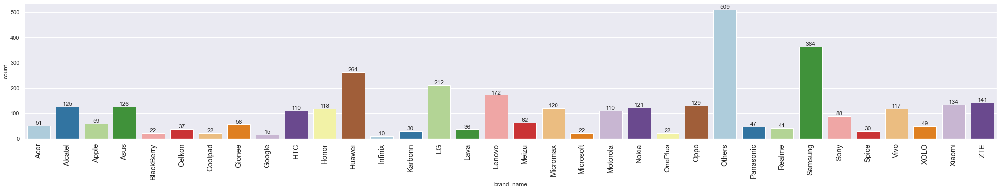

In [36]:
# Display count plots and pie charts of categorical variables
labeled_barplot(cell, "brand_name")

* data spans on cell phones from 34 different brand, Majority of them from the following brands
* Samsung: 364
* Huawie: 264
* LG: 212
* Lenovo: 172

#### Mean used_price according to brand and operating system

<AxesSubplot:ylabel='Frequency'>

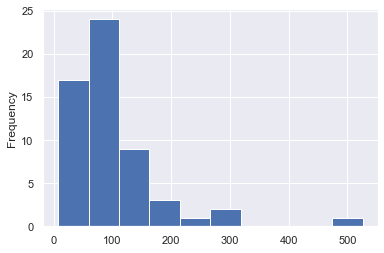

In [37]:
brand = cell.groupby(['brand_name', 'os'])['used_price'].mean().reset_index()

brand['used_price'].plot(kind='hist')

#### Mean used_price according to brand

<AxesSubplot:ylabel='Frequency'>

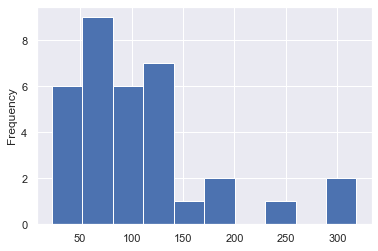

In [38]:
brand_b = cell.groupby('brand_name')['used_price'].mean().reset_index()

brand_b['used_price'].plot(kind='hist')

In [39]:
cell.used_price.nunique()

3044

## Count plots of brand_name, os, 4_g and 5_g

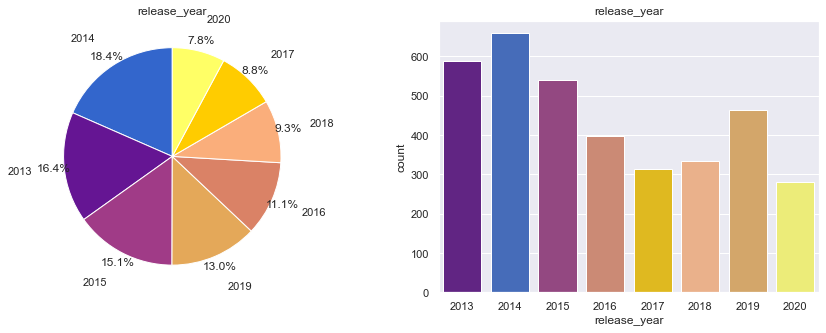

In [40]:
# Display count plots and pie charts of categorical variables
list_col=['brand_name', 'os', 'four_g', 'five_g']
# function to display count plots and pie charts of categorical variable: language_preferred
colors_list = ['#3366cc','#651593','#a03b87','#e4a859','#da8266',"#FAAE7B", '#ffcc00','#ffff66']
f,ax=plt.subplots(1,2,figsize=(15,5))
cell['release_year'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],startangle=90,colors = colors_list,pctdistance=1.1, labeldistance=1.3)
ax[0].set_title('release_year')
ax[0].set_ylabel('')
sns.countplot('release_year',data=cell,ax=ax[1],palette =(['#651593','#3366cc','#a03b87','#da8266','#ffcc00',"#FAAE7B",'#e4a859','#ffff66']))
ax[1].set_title('release_year')
plt.show()



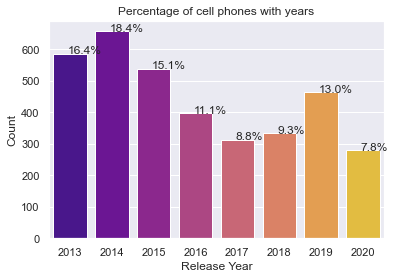

In [41]:
#axis=sns.countplot(x='release_year', data=cell ,palette='plasma').set(title='release_year')
#bar_perc(axis,['release_year'])
# Function to create barplots that indicate percentage for each category.
def bar_perc(plot, feature):
    '''
    plot
    feature: 1-d categorical feature array
    '''
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 12) # annotate the percantage
# percentage of products
ax = sns.countplot(cell['release_year'],palette='plasma')
plt.title('Percentage of cell phones with years')
plt.xlabel('Release Year')
plt.ylabel('Count')
bar_perc(ax,cell['release_year'])

#### Q2. What percentage of the used phone market is dominated by Android devices?

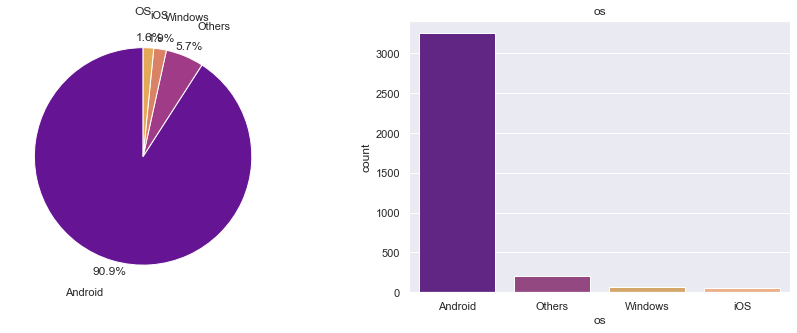

In [42]:
# Display count plots and pie charts of categorical variables
list_col=['brand_name', 'os', 'four_g', 'five_g']
# function to display count plots and pie charts of categorical variable: language_preferred
colors_list = ['#651593','#a03b87','#da8266','#e4a859','#432371',"#FAAE7B"]
f,ax=plt.subplots(1,2,figsize=(15,5))
cell['os'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],startangle=90,colors = colors_list,pctdistance=1.1, labeldistance=1.3)
ax[0].set_title('OS')
ax[0].set_ylabel('')
sns.countplot('os',data=cell,ax=ax[1],palette =(['#651593','#a03b87','#e4a859',"#FAAE7B",'#da8266']))
ax[1].set_title('os')
plt.show()



* 90.9% of used phone market is dominated by Android devices.
* 1.9% Windows, 1.6% iOS and 5.7% other operating system phones.

### 4-g phones

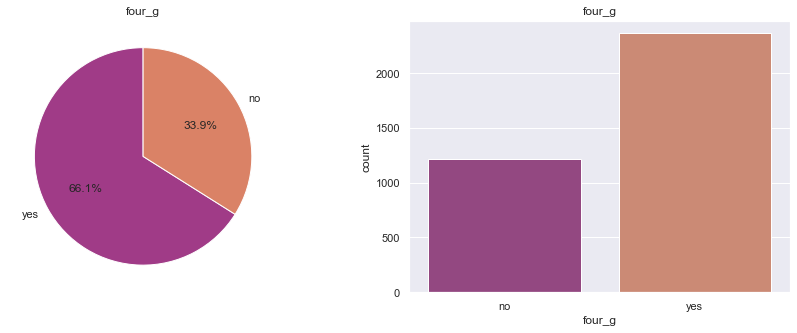

In [43]:
# Display count plots and pie charts of categorical variables
list_col=['brand_name', 'os', 'four_g', 'five_g']
# function to display count plots and pie charts of categorical variable: language_preferred
colors_list = ['#a03b87','#da8266','#651593','#e4a859','#432371',"#FAAE7B"]
f,ax=plt.subplots(1,2,figsize=(15,5))
cell['four_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],startangle=90,colors = colors_list)
ax[0].set_title('four_g')
ax[0].set_ylabel('')
sns.countplot('four_g',data=cell,ax=ax[1],palette =(['#a03b87','#da8266','#432371','#3399ff',"#FAAE7B"]))
ax[1].set_title('four_g')
plt.show()



* Majority phones: 66.1% have 4-g technology
* ~34% do not have 4-g

### 5-g phones

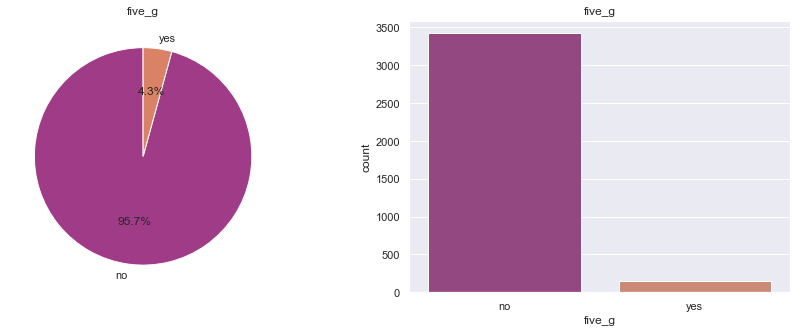

In [44]:
# Display count plots and pie charts of categorical variables

# function to display count plots and pie charts of categorical variable: language_preferred
colors_list = ['#a03b87','#da8266','#651593','#e4a859','#432371',"#FAAE7B"]
colors_list2 = ['#10121147','pink','#3399ff','#432371',"#FAAE7B"]
f,ax=plt.subplots(1,2,figsize=(15,5))
cell['five_g'].value_counts().plot.pie(autopct='%1.1f%%',ax=ax[0],startangle=90,colors = colors_list)
ax[0].set_title('five_g')
ax[0].set_ylabel('')
sns.countplot('five_g',data=cell,ax=ax[1],palette =(['#a03b87','#da8266','#432371','#3399ff',"#FAAE7B"]))
ax[1].set_title('five_g')
plt.show()



* Majority phones: 95.7% do not have 5-g technology.... may be as 5-g is in rather new technology.
* 4.3%  have 5-g

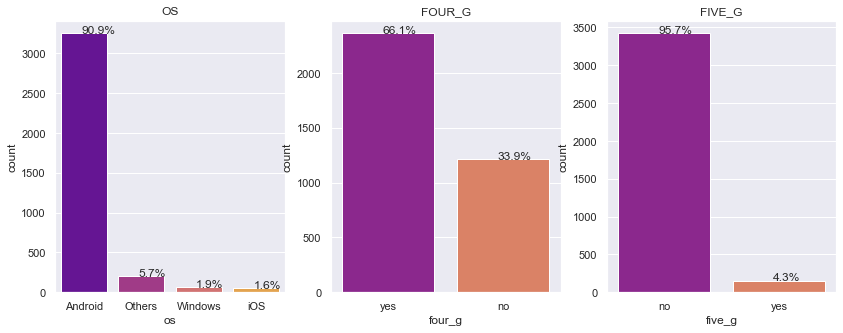

In [45]:
# Function to create barplots that indicate percentage for each category.
def bar_perc(plot, feature):
    '''
    plot
    feature: 1-d categorical feature array
    '''
    total = len(feature) # length of the column
    for p in plot.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.05 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        plot.annotate(percentage, (x, y), size = 12) # annotate the percentage
    
fig1, axes1 =plt.subplots(1,3,figsize=(14,5))
list_col=['os', 'four_g', 'five_g']
j=0
for i in range(len(list_col)):
    order = cell[list_col[i]].value_counts(ascending=False).index # to display bar in ascending order
    axis=sns.countplot(x=list_col[i], data=cell , order=order,ax=axes1[i],palette='plasma').set(title=list_col[i].upper())
    bar_perc(axes1[i],cell[list_col[i]])


###  Observations


* os is ~91% dominated by Android in used phone market. Other operating systems have very small percentage.
* 4-g technology is present in 66.1% as compared to 33.9% phones with out 4-g.
* 5-g technology is present only in 4.3% as compared to 95.7% phones with out 5-g.5-g phones could be newer phones. 

**Questions**:

1. What does the distribution of used phone prices look like?
2. What percentage of the used phone market is dominated by Android devices?
3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?
4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?
5. Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?
6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?
7. Which attributes are highly correlated with the used phone price?

## Missing Values Treatment

In [46]:
temp=cell.copy()

#cell=temp.copy()

In [47]:
# most rows don't have missing values now
num_missing = cell.isnull().sum(axis=1)
num_missing.value_counts()

0    3368
1     193
2       8
3       2
dtype: int64

In [48]:
# these are missing int_memory and ram and battery
cell[num_missing == 3]

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2140,Nokia,Others,5.720,no,no,0.300,0.300,nan,nan,nan,81.000,2016,815,29.210,8.650
2141,Nokia,Others,5.720,no,no,0.300,0.300,nan,nan,nan,82.600,2016,1023,38.780,11.420


In [49]:
# these are missing int_memory and ram
cell[num_missing == 2]

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2142,Nokia,Others,6.350,no,no,2.000,2.000,nan,nan,1200.000,91.800,2015,867,68.010,20.460
2143,Nokia,Others,6.350,no,no,2.000,2.000,nan,nan,1200.000,91.800,2015,772,69.940,28.060
2144,Nokia,Others,5.720,no,no,2.000,2.000,nan,nan,1100.000,79.000,2015,1012,41.920,12.520
2145,Nokia,Others,5.720,no,no,2.000,2.000,nan,nan,1100.000,79.000,2015,798,40.480,16.130
2146,Nokia,Others,3.180,no,no,2.000,2.000,nan,nan,800.000,69.600,2015,1009,19.920,6.070
2147,Nokia,Others,3.180,no,no,2.000,2.000,nan,nan,800.000,69.800,2015,665,18.480,7.480
2148,Nokia,Others,5.720,no,no,0.300,2.000,nan,nan,1100.000,78.400,2015,559,29.330,14.760
2149,Nokia,Others,5.720,no,no,0.300,2.000,nan,nan,1100.000,78.600,2015,682,30.000,12.030


In [50]:
# these are missing int_memory and ram
cell[num_missing == 1].sample(15)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
287,Infinix,Android,16.190,yes,no,nan,8.000,32.000,2.000,5000.000,185.000,2020,329,88.880,57.950
418,Coolpad,Android,20.960,yes,no,nan,13.000,32.000,3.000,4000.000,170.000,2019,342,161.610,105.360
3483,Motorola,Android,16.030,yes,no,nan,8.000,64.000,4.000,5000.000,200.000,2020,277,122.400,84.730
2780,Sony,Android,16.030,yes,no,nan,8.000,64.000,4.000,3000.000,180.000,2019,252,429.100,295.970
356,Oppo,Android,15.880,yes,yes,nan,32.000,128.000,8.000,4025.000,180.000,2020,218,399.550,299.980
197,Xiaomi,Android,25.880,yes,yes,nan,16.000,128.000,6.000,4500.000,208.000,2020,184,260.810,196.450
2782,Sony,Android,13.810,yes,no,nan,8.000,32.000,4.000,3300.000,156.000,2019,195,198.150,149.100
200,Xiaomi,Android,18.730,yes,no,nan,8.000,32.000,2.000,5000.000,188.000,2020,321,80.820,52.130
325,Meizu,Android,16.030,yes,no,nan,16.000,128.000,6.000,4500.000,183.000,2019,348,251.190,164.230
164,Vivo,Android,24.290,yes,yes,nan,16.000,128.000,6.000,4500.000,198.100,2020,312,349.830,227.880


In [51]:
cell.iloc[2138:2152]

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2138,Nokia,Android,13.490,yes,no,16.000,8.000,32.000,4.000,3000.000,169.000,2017,540,160.960,80.560
2139,Nokia,Others,5.720,no,no,2.000,8.000,32.000,4.000,3000.000,160.000,2017,554,60.260,30.190
2140,Nokia,Others,5.720,no,no,0.300,0.300,nan,nan,nan,81.000,2016,815,29.210,8.650
2141,Nokia,Others,5.720,no,no,0.300,0.300,nan,nan,nan,82.600,2016,1023,38.780,11.420
2142,Nokia,Others,6.350,no,no,2.000,2.000,nan,nan,1200.000,91.800,2015,867,68.010,20.460
2143,Nokia,Others,6.350,no,no,2.000,2.000,nan,nan,1200.000,91.800,2015,772,69.940,28.060
2144,Nokia,Others,5.720,no,no,2.000,2.000,nan,nan,1100.000,79.000,2015,1012,41.920,12.520
2145,Nokia,Others,5.720,no,no,2.000,2.000,nan,nan,1100.000,79.000,2015,798,40.480,16.130
2146,Nokia,Others,3.180,no,no,2.000,2.000,nan,nan,800.000,69.600,2015,1009,19.920,6.070
2147,Nokia,Others,3.180,no,no,2.000,2.000,nan,nan,800.000,69.800,2015,665,18.480,7.480


* Cell phones with Two missing values are 8 rows with nokia with no int_memory and ram,
* the upper two row values and the lower two values are similar: int_memory=32 and ram=4. 
* We can manually replace the nan in these rows with these values
* Treating missing values of columns int_memory and ram by using following methods:
    - Last Observation Carried Forward (LOCF) for variables int_memory and ram
    - Next Observation Carried Backward (NOCB) for variable battery

In [52]:
#changing the int_memory of these rows to '32', the previous value
cell.iloc[2140:2150,7]=cell.iloc[2138,7]
cell.iloc[2140:2150,8]=cell.iloc[2138,8]
cell.iloc[2140:2142,9]=cell.iloc[2142,9]

In [53]:
cell.iloc[2138:2152]

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2138,Nokia,Android,13.490,yes,no,16.000,8.000,32.000,4.000,3000.000,169.000,2017,540,160.960,80.560
2139,Nokia,Others,5.720,no,no,2.000,8.000,32.000,4.000,3000.000,160.000,2017,554,60.260,30.190
2140,Nokia,Others,5.720,no,no,0.300,0.300,32.000,4.000,1200.000,81.000,2016,815,29.210,8.650
2141,Nokia,Others,5.720,no,no,0.300,0.300,32.000,4.000,1200.000,82.600,2016,1023,38.780,11.420
2142,Nokia,Others,6.350,no,no,2.000,2.000,32.000,4.000,1200.000,91.800,2015,867,68.010,20.460
2143,Nokia,Others,6.350,no,no,2.000,2.000,32.000,4.000,1200.000,91.800,2015,772,69.940,28.060
2144,Nokia,Others,5.720,no,no,2.000,2.000,32.000,4.000,1100.000,79.000,2015,1012,41.920,12.520
2145,Nokia,Others,5.720,no,no,2.000,2.000,32.000,4.000,1100.000,79.000,2015,798,40.480,16.130
2146,Nokia,Others,3.180,no,no,2.000,2.000,32.000,4.000,800.000,69.600,2015,1009,19.920,6.070
2147,Nokia,Others,3.180,no,no,2.000,2.000,32.000,4.000,800.000,69.800,2015,665,18.480,7.480


In [54]:
cell.isnull().sum(axis=1).value_counts()

0    3378
1     193
dtype: int64

In [55]:
cell.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   brand_name        3571 non-null   category
 1   os                3571 non-null   category
 2   screen_size       3571 non-null   float64 
 3   four_g            3571 non-null   category
 4   five_g            3571 non-null   category
 5   main_camera_mp    3391 non-null   float64 
 6   selfie_camera_mp  3569 non-null   float64 
 7   int_memory        3571 non-null   float64 
 8   ram               3571 non-null   float64 
 9   battery           3567 non-null   float64 
 10  weight            3564 non-null   float64 
 11  release_year      3571 non-null   int64   
 12  days_used         3571 non-null   int64   
 13  new_price         3571 non-null   float64 
 14  used_price        3571 non-null   float64 
dtypes: category(4), float64(9), int64(2)
memory usage: 322.8 KB


In [56]:
list_col_n=['main_camera_mp','selfie_camera_mp', 'battery', 'weight']
beg_null = cell.isnull().sum().sum()
print(beg_null)
for i in list_col_n:
    # notice that we have filtering the columns  as a list.
    cell[[i]] = cell[[i]].apply(lambda x: x.fillna(x.median()))
    end_null = cell.isnull().sum().sum()
    print(end_null)
    print("We have got rid of {} null values, filling them with the median.".format(beg_null - end_null))

193
13
We have got rid of 180 null values, filling them with the median.
11
We have got rid of 182 null values, filling them with the median.
7
We have got rid of 186 null values, filling them with the median.
0
We have got rid of 193 null values, filling them with the median.


In [57]:
cell.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 15 columns):
 #   Column            Non-Null Count  Dtype   
---  ------            --------------  -----   
 0   brand_name        3571 non-null   category
 1   os                3571 non-null   category
 2   screen_size       3571 non-null   float64 
 3   four_g            3571 non-null   category
 4   five_g            3571 non-null   category
 5   main_camera_mp    3571 non-null   float64 
 6   selfie_camera_mp  3571 non-null   float64 
 7   int_memory        3571 non-null   float64 
 8   ram               3571 non-null   float64 
 9   battery           3571 non-null   float64 
 10  weight            3571 non-null   float64 
 11  release_year      3571 non-null   int64   
 12  days_used         3571 non-null   int64   
 13  new_price         3571 non-null   float64 
 14  used_price        3571 non-null   float64 
dtypes: category(4), float64(9), int64(2)
memory usage: 322.8 KB


## Bivariate & Multivariate Analysis of Categorical Variables

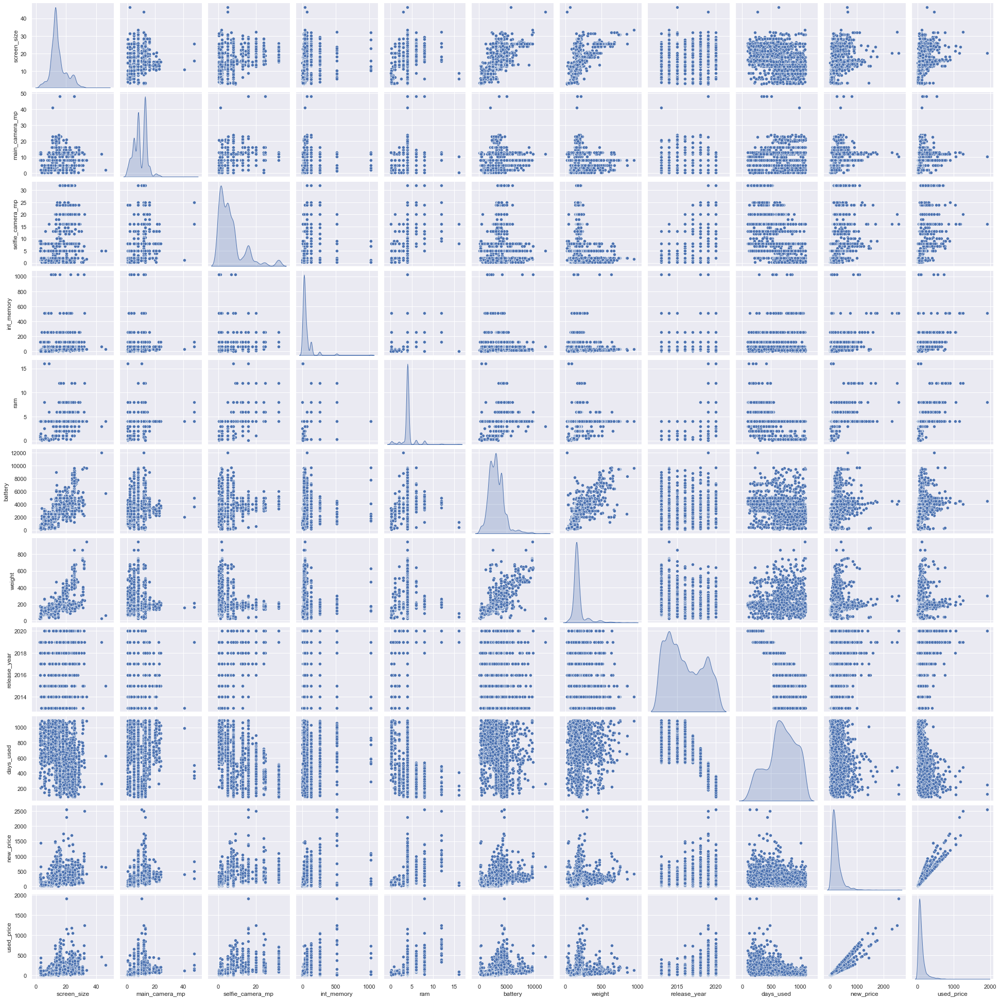

In [58]:
# pairplot of numeric variables
sns.pairplot(cell, diag_kind='kde')   # to plot density curve instead of histogram on the diag

#### Q3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?

In [59]:
df_ram=cell.groupby("brand_name")["ram"].mean()
df_ram.mean

<bound method Series.mean of brand_name
Acer         3.902
Alcatel      3.426
Apple        4.000
Asus         4.048
BlackBerry   3.830
Celkon       1.466
Coolpad      3.955
Gionee       3.933
Google       4.533
HTC          4.000
Honor        4.593
Huawei       4.641
Infinix      2.600
Karbonn      3.375
LG           3.894
Lava         3.278
Lenovo       3.887
Meizu        4.452
Micromax     3.750
Microsoft    4.000
Motorola     3.945
Nokia        3.634
OnePlus      6.364
Oppo         4.961
Others       3.751
Panasonic    4.000
Realme       4.195
Samsung      4.159
Sony         4.068
Spice        3.750
Vivo         4.756
XOLO         4.000
Xiaomi       4.567
ZTE          4.023
Name: ram, dtype: float64>

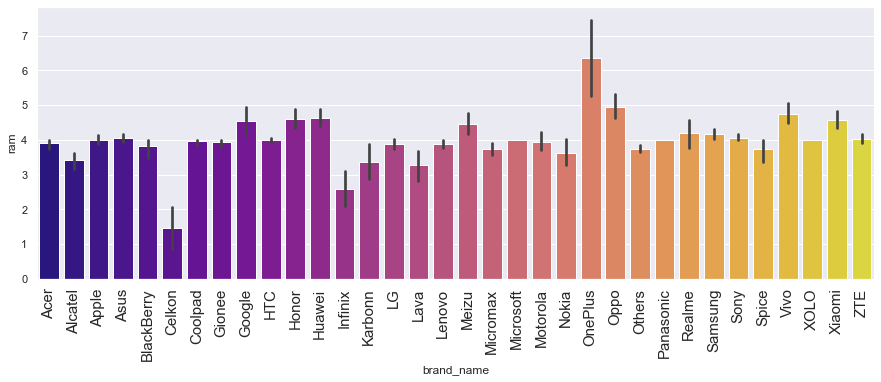

In [60]:
plt.figure(figsize=(15, 5))
sns.barplot('brand_name', 'ram', data=cell, palette='plasma');
plt.xticks(rotation=90, fontsize=15);

* brands vary in ram in range 1.5-6GB or 4gb ram on average 

#### Q4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?

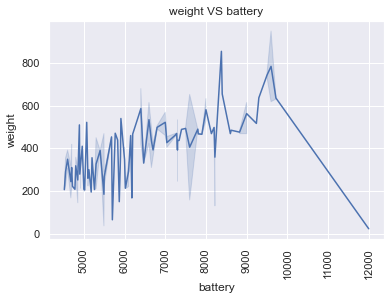

In [61]:
df_bw = cell[cell.battery > 4500]
df_bw.groupby("battery")["weight"].mean()
# # display point plot of time_spent_on_the_page vs language_preferred and converted 
sns.lineplot(x=df_bw['battery'], y=df_bw["weight"]);
plt.title('weight VS battery')
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()

In [62]:
df_bw.mean()

screen_size          21.487
main_camera_mp        9.001
selfie_camera_mp      7.206
int_memory           59.145
ram                   4.246
battery            5884.103
weight              330.719
release_year       2017.113
days_used           568.760
new_price           307.462
used_price          155.901
dtype: float64

* On average phones with higher battery also have higher weight. 
* Some phones have weight too hight to be a cell phone weight. Cell phone heavier than 600 grams would be too heavy, maybe their units are wrong or data is errenous.

#### Q5. Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?

* Converting screen size from cm to inches

In [63]:
# function to convert screen size from cm to inches
def cm_to_inch (data):
    data=round(data*2.54,2)
    return data
temp=cell.copy()
cell[['screen_size']]=cm_to_inch(cell['screen_size'])
cell.sample(20)

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
2514,Samsung,Android,35.080,yes,no,16.000,16.000,64.000,4.000,3300.000,172.000,2017,623,300.370,120.100
1342,Huawei,Android,39.120,yes,no,13.000,24.000,64.000,4.000,4000.000,180.000,2018,700,617.500,246.970
764,Asus,Android,34.260,yes,no,13.000,13.000,32.000,4.000,5000.000,170.000,2017,582,320.100,160.110
2530,Samsung,Android,35.080,yes,no,12.000,5.000,64.000,4.000,3500.000,169.000,2016,852,760.910,228.120
2173,Nokia,Windows,38.710,yes,no,20.000,1.200,16.000,4.000,3400.000,209.000,2013,1052,351.080,105.400
1346,Huawei,Android,72.190,yes,no,13.000,8.000,32.000,4.000,3000.000,155.000,2018,617,168.850,67.460
298,Lenovo,Android,54.430,yes,no,8.000,16.000,64.000,6.000,4000.000,159.000,2019,426,250.590,125.200
2367,Others,Android,45.160,no,no,2.000,0.300,32.000,4.000,4000.000,305.000,2013,657,131.140,52.510
594,Others,Android,39.520,yes,no,12.000,8.000,32.000,4.000,4000.000,168.000,2018,396,219.530,142.730
167,Vivo,Android,56.440,yes,yes,13.000,32.000,128.000,8.000,4350.000,196.500,2019,279,422.190,296.810


In [64]:
temp.describe()

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price
count,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000,3571.000
mean,14.804,9.330,6.546,54.470,4.057,3066.105,179.384,2015.965,675.391,237.389,109.880
std,5.153,4.705,6.878,84.586,1.390,1363.777,90.197,2.292,248.641,197.546,121.501
min,2.700,0.080,0.300,0.005,0.030,80.000,23.000,2013.000,91.000,9.130,2.510
25%,12.700,5.000,2.000,16.000,4.000,2100.000,140.000,2014.000,536.000,120.130,45.205
50%,13.490,8.000,5.000,32.000,4.000,3000.000,159.000,2016.000,690.000,189.800,75.530
75%,16.510,13.000,8.000,64.000,4.000,4000.000,184.000,2018.000,872.000,291.935,126.000
max,46.360,48.000,32.000,1024.000,16.000,12000.000,950.000,2020.000,1094.000,2560.200,1916.540


In [65]:
temp1=cell[cell['screen_size']>6]
print(temp.screen_size.value_counts().sort_values(ascending=False))
print(temp.screen_size.unique() )
print(temp.screen_size.nunique())

12.700    576
13.490    409
10.950    219
10.160    189
15.240    129
         ... 
28.730      1
14.600      1
11.910      1
10.320      1
31.430      1
Name: screen_size, Length: 127, dtype: int64
[23.97 28.1  24.29 26.04 15.72 21.43 19.84 18.57 16.67  8.73 19.37 24.61
 25.56 20.32 15.56 13.81 15.24 16.03 24.45 26.67 15.88 23.65 25.08 20.96
 10.16 17.78 28.26 16.19 12.7  16.51  6.35 15.4  18.73 18.26 13.49  3.02
  7.62  8.41 22.7  16.35 23.5   5.72 14.76 25.88 22.07 10.95 14.13 22.22
 24.13 21.27 29.37 20.8  21.75 23.34 28.42 14.92 32.39 23.02 21.91 26.19
 12.86  3.18 43.66  2.86 31.91 27.94 25.72 19.21  3.81 11.27 10.64 13.18
 13.02  6.03 23.81 20.48 20.64 11.43 20.16 13.97  3.33 28.73 12.54  9.68
 13.34  7.78 10.48  5.08  5.4  25.24 19.69 30.32 27.46 15.08 30.96 31.43
 31.27 25.4  17.62 18.1   9.05  7.94 30.8  33.5   8.57 24.92  8.89 27.78
 20.   18.42  5.56 14.6  26.35 18.89  8.1   2.7  13.65 46.36  9.84 22.38
 10.8  11.91 11.11  3.49 19.53 10.32 17.94]
127


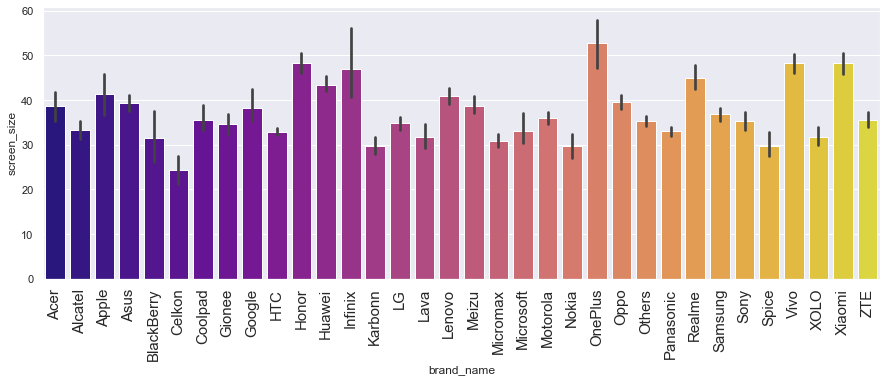

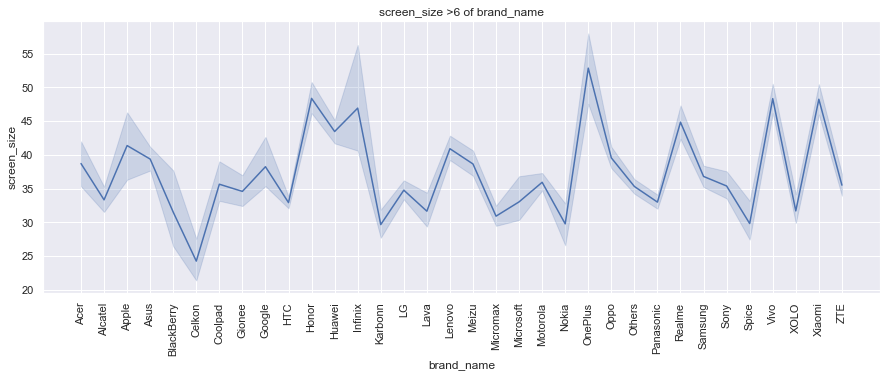

In [66]:
plt.figure(figsize=(15, 5))
sns.barplot('brand_name', 'screen_size', data=temp1, palette='plasma');
plt.xticks(rotation=90, fontsize=15);

# # display point plot of time_spent_on_the_page vs language_preferred and converted 
plt.figure(figsize=(15, 5))
sns.lineplot(x=temp1['brand_name'], y=temp1["screen_size"]);
plt.title('screen_size >6 of brand_name')
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()

* Screen size on average are between 6"and 8".
* There are also some very big screen size present, like blackberry 11"+ and Microsoft 10"+, which may be some error in the data.

#### Q6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?

In [67]:
# function to plot distribution of given data
def plot_distribution(inp):
    plt.figure()
    ax = sns.distplot(inp)
    plt.axvline(np.mean(inp), color ='k',linestyle='dashed', linewidth=5)
    _,max_ = plt.ylim()
    plt.text(
        inp.mean() + inp.mean() / 10,
        max_ - max_ / 10,
        "Mean; {:.2f}".format(inp.mean()),
        
    )
    return plt.figure

In [68]:
selfie=cell[cell['selfie_camera_mp']>8]

In [69]:
selfie.groupby('brand_name')['selfie_camera_mp'].count()
selfie.sort_values(by='selfie_camera_mp')
selfie.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,666.000,46.569,11.666,6.860,39.520,40.920,55.958,82.270
main_camera_mp,666.000,11.386,4.297,0.300,8.000,12.000,13.000,48.000
selfie_camera_mp,666.000,18.680,6.312,9.000,16.000,16.000,20.000,32.000
int_memory,666.000,108.240,83.033,4.000,64.000,128.000,128.000,1024.000
ram,666.000,5.266,2.089,0.030,4.000,4.000,6.000,16.000
battery,666.000,3828.559,776.013,230.000,3400.000,4000.000,4200.000,6000.000
weight,666.000,180.390,28.711,25.000,165.550,181.000,196.375,300.000
release_year,666.000,2018.631,1.234,2013.000,2018.000,2019.000,2019.000,2020.000
days_used,666.000,424.200,206.416,91.000,264.000,385.500,545.250,1091.000
new_price,666.000,387.318,291.621,99.700,218.923,299.340,459.870,2560.200


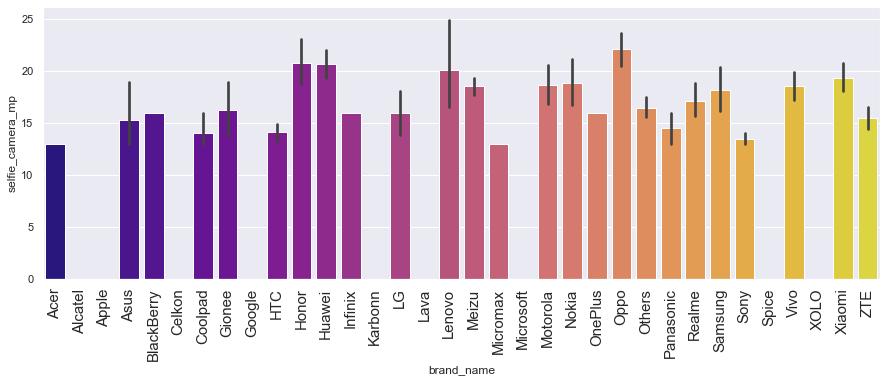

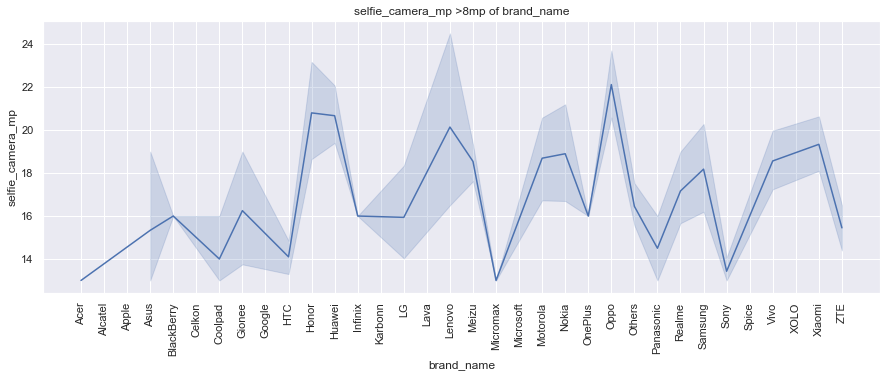

In [70]:
plt.figure(figsize=(15, 5))
sns.barplot('brand_name', 'selfie_camera_mp', data=selfie, palette='plasma');
plt.xticks(rotation=90, fontsize=15);

# # display point plot of time_spent_on_the_page vs language_preferred and converted 
plt.figure(figsize=(15, 5))
sns.lineplot(x=selfie['brand_name'], y=selfie["selfie_camera_mp"]);
plt.title('selfie_camera_mp >8mp of brand_name')
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()

<function matplotlib.pyplot.figure(num=None, figsize=None, dpi=None, facecolor=None, edgecolor=None, frameon=True, FigureClass=<class 'matplotlib.figure.Figure'>, clear=False, **kwargs)>

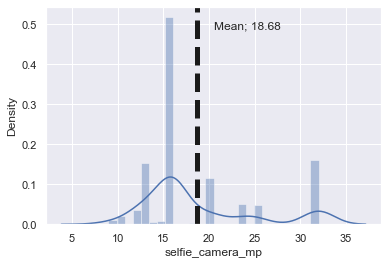

In [71]:
# plot distribution of selfie_camera_mp of used phones
plot_distribution(selfie["selfie_camera_mp"])

* Specifications of selfie_camera_mp > 8mp
* max is 32mp
* mean is 18.7mp
* 50% of these phones have under 16mp

#### Q7.Which attributes are highly correlated with the used phone price?

<AxesSubplot:>

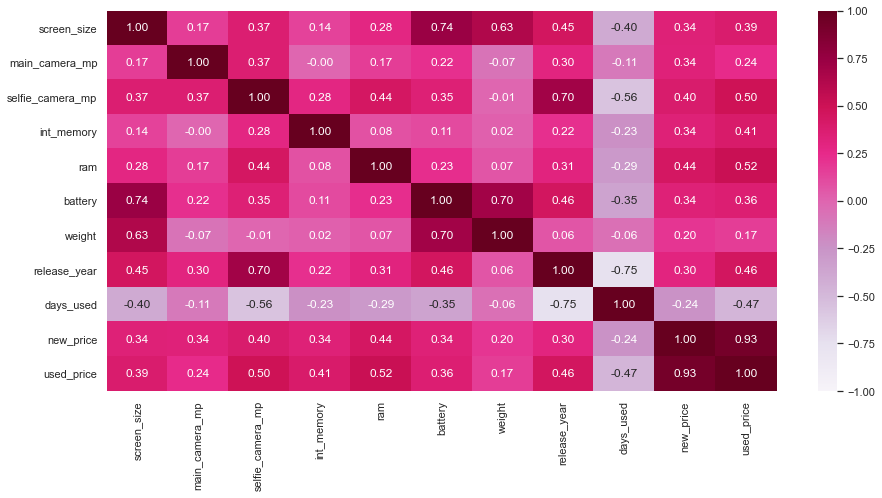

In [72]:
# heatmap of cell data to show correlation between numeric variables
numeric_columns = cell.select_dtypes(include=np.number).columns.tolist()
#numeric_columns.remove("Year")  # dropping year column as it is temporal variable
plt.figure(figsize=(15,7))
sns.heatmap(cell.corr(), annot=True, vmin=-1, vmax=1, fmt='.2f', cmap='PuRd')

### Observations:
1. new_price and used_price have high positive correlation; 0.93
2. release_year and selfie_camera_mp shows moderately high positive correlation: 0.7
3. weight and screen_size: 0.63, weight and battery: 0.7
4. battery and screen size also have high correlation: 0.74
5. days_used has high negative correlation with selfie_camera_mp: -0.56
6. used_price has somewhat negative correlation with days_used: -0.47

#### Q8. Consumers cut back on discretionary spending and buy phones only for immediate needs, What percentage of phones comes under budget phone with used_price 500 or less.

In [73]:
budget=cell.copy()

In [74]:
groupby = budget.groupby('brand_name', axis=0)
groupby.mean()
# Binning of the data based on a condition  0: budget<=500, 1: expensive:>500
budget.loc[(budget['used_price'] <= 250), 'u_budget_price'] = "low"# budget phones under 500 price range
budget.loc[(budget['used_price'] > 250) & (budget['used_price'] <= 500), 'u_budget_price'] ="medium" # budget phones under 500 price range
budget.loc[(budget['used_price'] > 500), 'u_budget_price'] = 'high' # phones above 500 price range
 
# Grouping and couting
budget.groupby('u_budget_price')['brand_name'].count().sort_values(ascending=False)


#df.loc[(df['first_name'] == 'Bill') | (df['first_name'] == 'Emma'), 'name_match'] = 'Match'  
#df.loc[(df['first_name'] != 'Bill') & (df['first_name'] != 'Emma'), 'name_match'] = 'Mismatch'

u_budget_price
low       3289
medium     215
high        67
Name: brand_name, dtype: int64

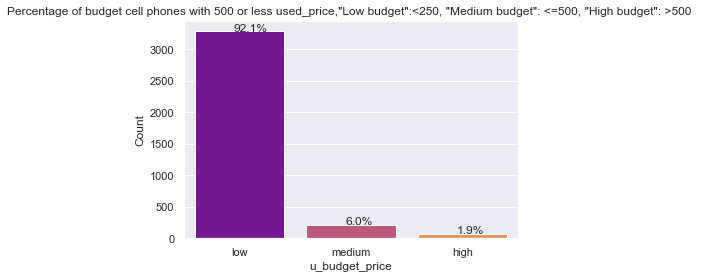

In [75]:
# percentage of budget cell phones vs expensive phones.
ax = sns.countplot(budget['u_budget_price'],palette='plasma')
plt.title('Percentage of budget cell phones with 500 or less used_price,"Low budget":<250, "Medium budget": <=500, "High budget": >500 ')
plt.xlabel('u_budget_price')
plt.ylabel('Count')
bar_perc(ax,budget['u_budget_price'])

- Majority:92.1% (3289 out of 3571) phones come under the low budget phone: (have price 250 or less)
- Majority:6.0% (215 out of 3571) phones come under the medium budget phone: (have price 250 or less)
- Minority:only 1.9% (67 out of 3571) phones come under the high bidget phone: (have price above 500)

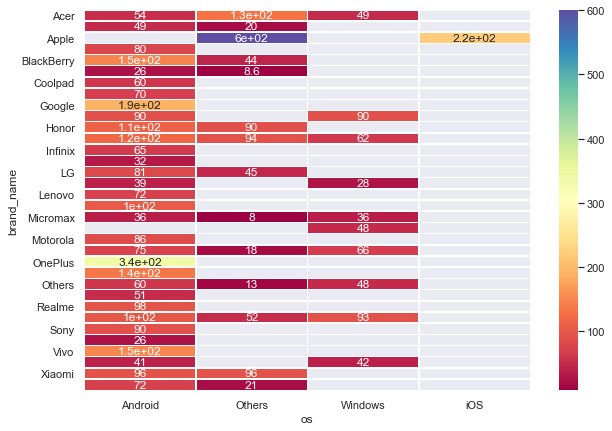

In [76]:
df_hm = cell.pivot_table(
    index="brand_name", columns="os", values="used_price", aggfunc=np.median
)

# Draw a heatmap
f, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(df_hm, cmap="Spectral", linewidths=0.5, annot=True, ax=ax)
plt.show()

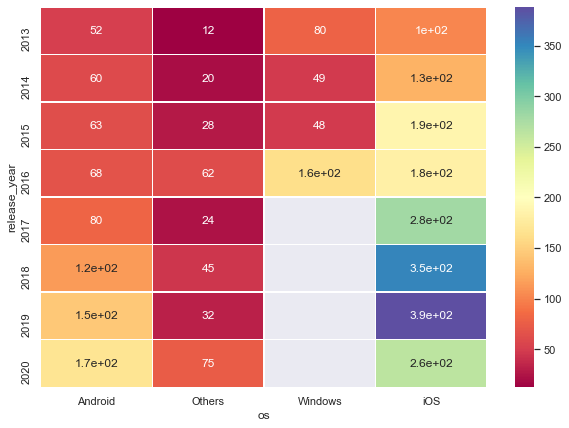

In [77]:
df_hm = cell.pivot_table(
    index="release_year", columns="os", values="used_price", aggfunc=np.median
)

# Draw a heatmap
f, ax = plt.subplots(figsize=(10, 7))
sns.heatmap(df_hm, cmap="Spectral", linewidths=0.5, annot=True, ax=ax)
plt.show()

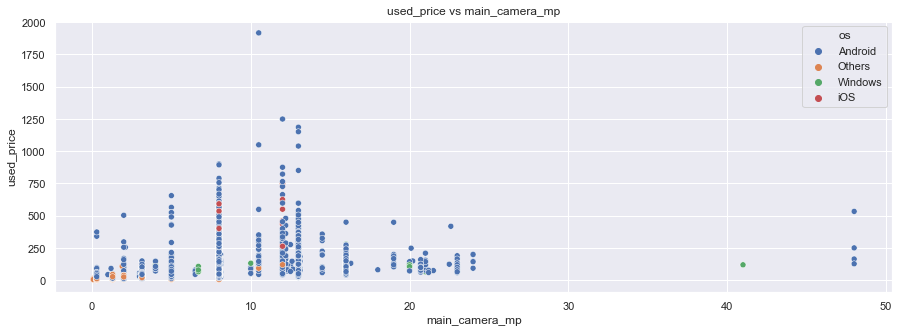

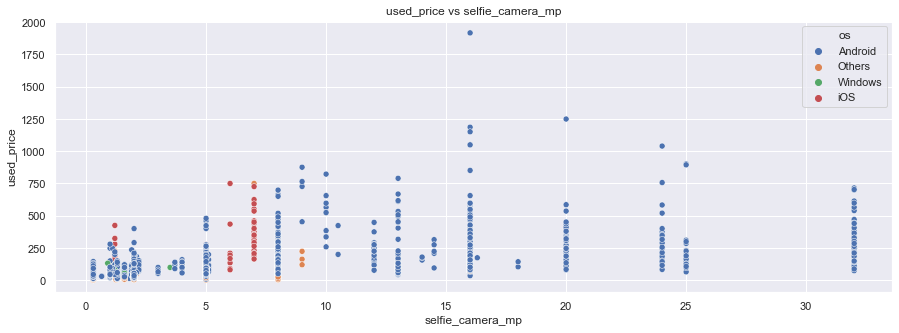

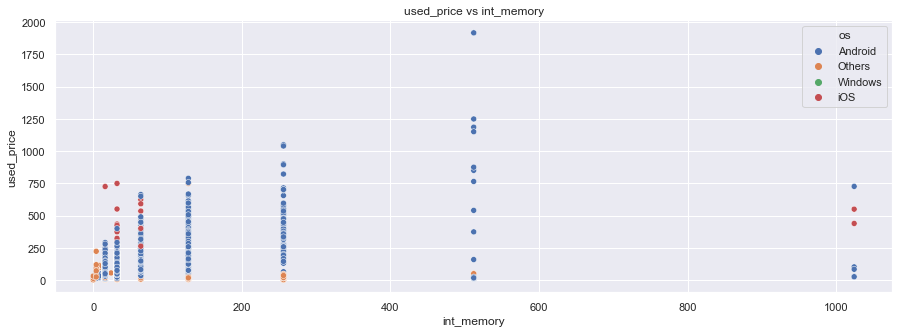

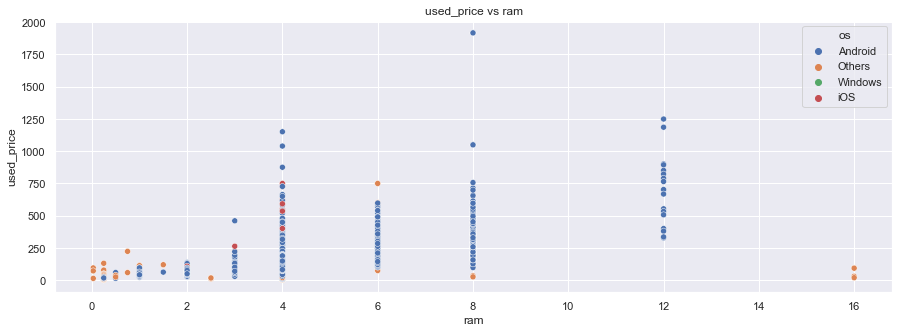

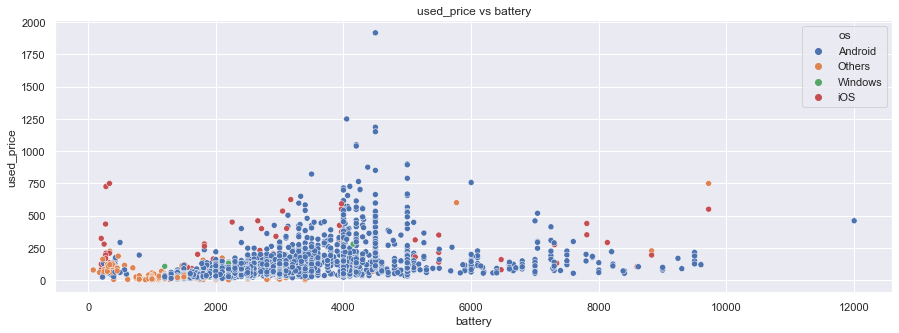

...

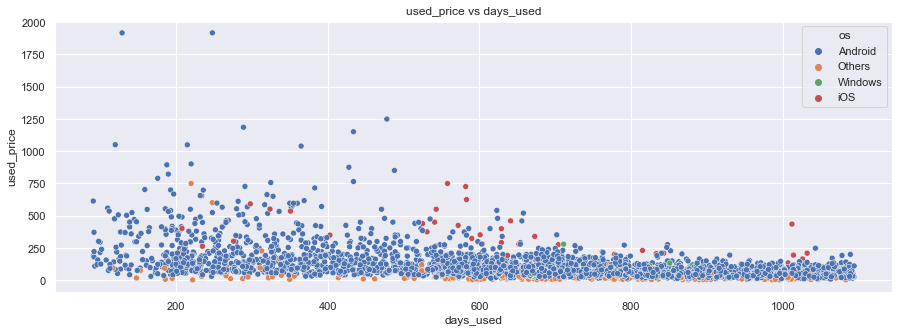

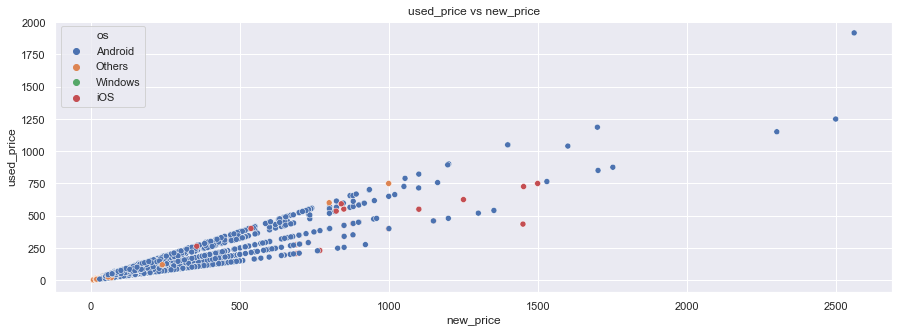

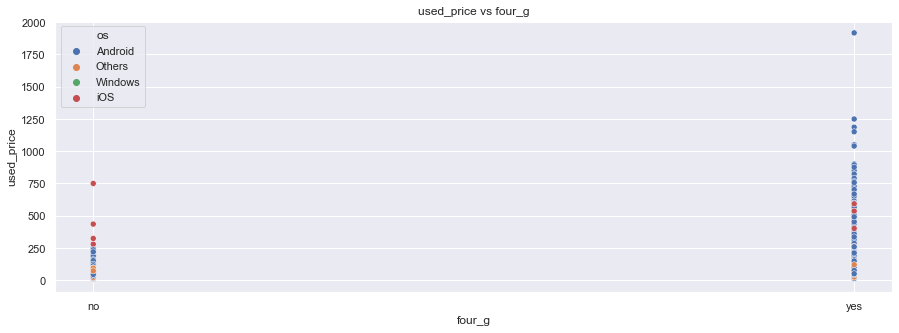

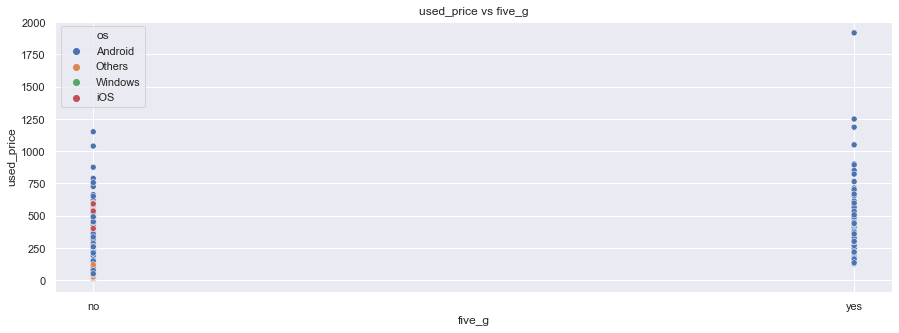

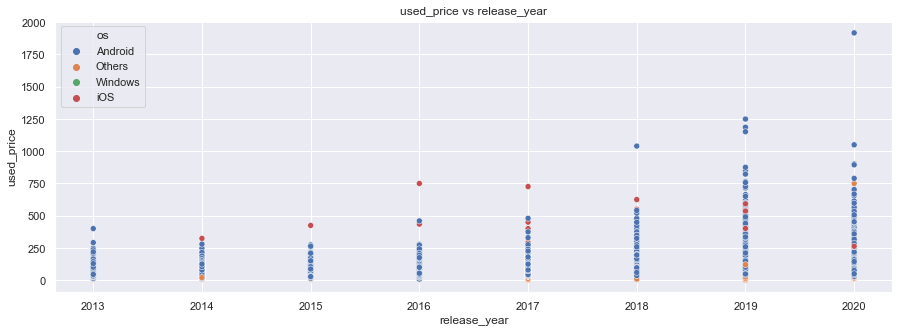

In [78]:
# Display hist plots of all variables VS time_spent_on_the_page
list_col=['main_camera_mp','selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
          'days_used','new_price','four_g','five_g', 'release_year']
for i in range(len(list_col)):
    plt.figure(figsize=(15, 5))
   #  order = cell[list_col[i]].value_counts(ascending=False).index # to display bar in ascending order
    axis=sns.scatterplot(data=cell, y="used_price", x=list_col[i],hue='os' )#kde = True
    plt.title("used_price vs "+ str(list_col[i]));
    plt.show()

* used_price has positive high correlation with new_price 

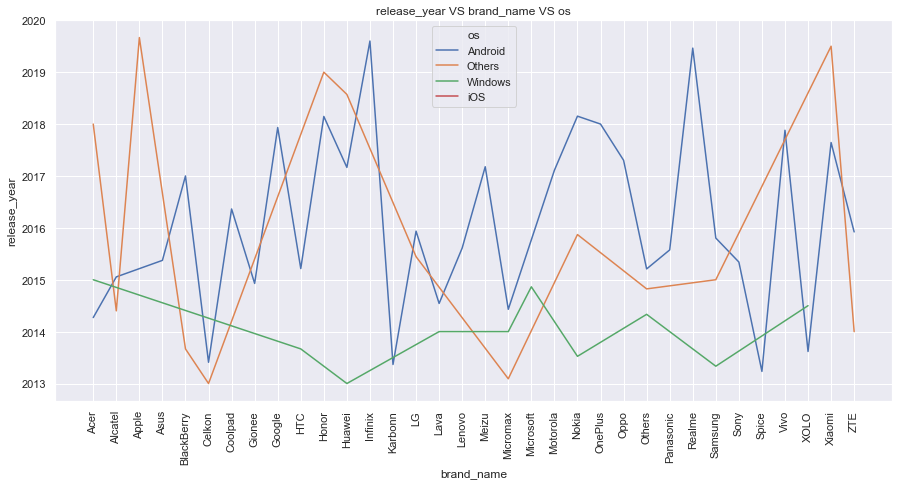

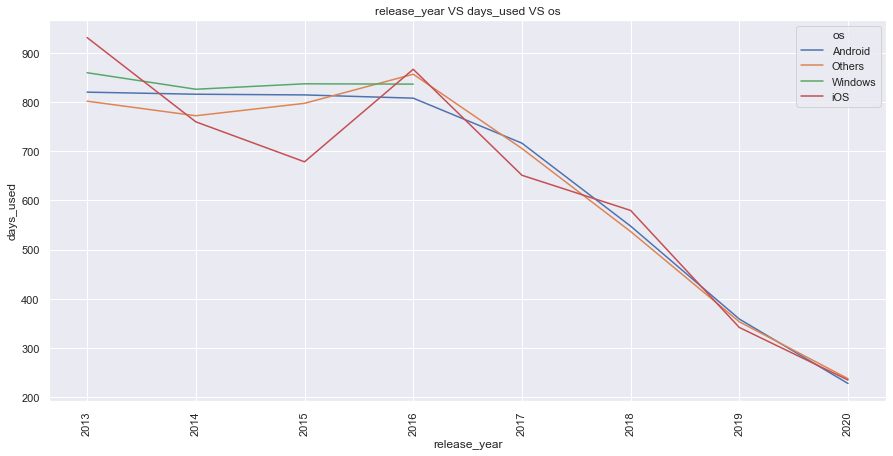

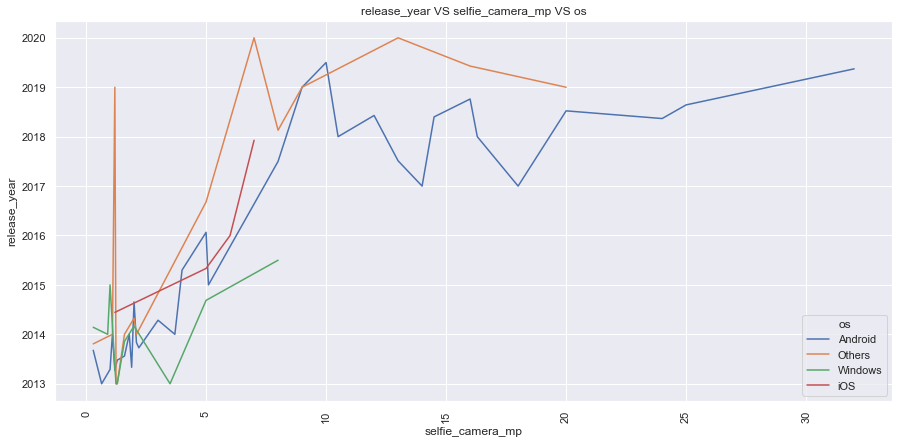

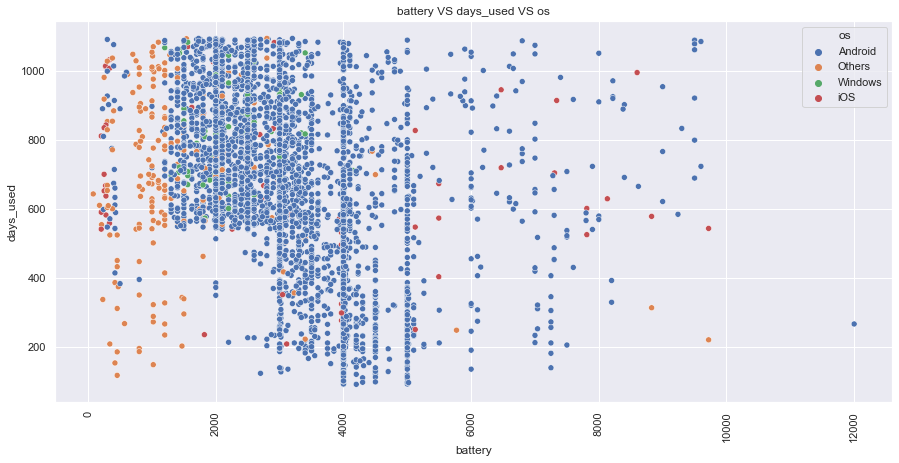

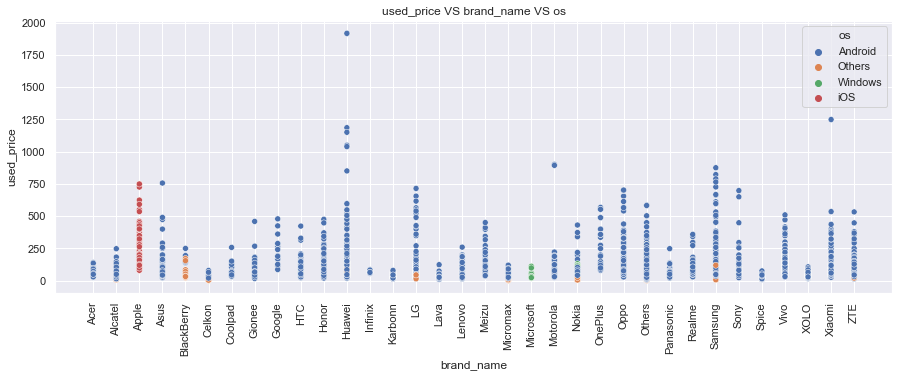

In [79]:
# average used_price vs other variables
plt.figure(figsize=(15, 7))
sns.lineplot(x="brand_name", y="release_year",hue="os", data=cell, ci=None)
plt.title("release_year VS brand_name VS os")
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()
plt.figure(figsize=(15, 7))
sns.lineplot(x="release_year", y="days_used",hue="os", data=cell, ci=None)
plt.title("release_year VS days_used VS os")
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()
plt.figure(figsize=(15, 7))
sns.lineplot(x="selfie_camera_mp", y="release_year",hue="os", data=cell, ci=None)
plt.title("release_year VS selfie_camera_mp VS os")
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()
plt.figure(figsize=(15, 7))
sns.scatterplot(x="battery", y="days_used",hue="os", data=cell, ci=None)
plt.title("battery VS days_used VS os")
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()
plt.figure(figsize=(15, 5))
sns.scatterplot(y="used_price", x="brand_name", hue="os", data=cell)
plt.title("used_price VS brand_name VS os")
plt.xticks(rotation=90); # To rotate the x axis labls
plt.show()

* Andoid phones are dominating the used phone market throughout the 8 years time span.
* days_used and released year sghow negative correlation
* battery and days_used also has somewhat negative correlation

## Outlier Detection and Treatment
Let's treat outliers in the data by flooring and capping.

In [80]:
df=cell.copy()

All of the points in each plot are drawn from the exact same distribution, so it's not fair to call any of the points outliers in the sense of there being bad data. But depending on the distribution in question, we may have almost all of the z-scores between -3 and 3 or instead there could be extremely large values. 

### Treating Categorical Variable: brand_name

- Frequency encoding brand_name as there are 34 unique brands with different prices

In [81]:
# Frequency Encoding brand_name
# as there are 34 unique brands, OHE will make many variables.
bn=df.groupby('brand_name').size()/len(df)
df.loc[:,'brand_name_encode'] = df['brand_name'].map(bn)
df

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price,brand_name_encode
0,Honor,Android,60.880,yes,no,13.000,5.000,64.000,3.000,3020.000,146.000,2020,127,111.620,86.960,0.033
1,Honor,Android,71.370,yes,yes,13.000,16.000,128.000,8.000,4300.000,213.000,2020,325,249.390,161.490,0.033
2,Honor,Android,61.700,yes,yes,13.000,8.000,128.000,8.000,4200.000,213.000,2020,162,359.470,268.550,0.033
3,Honor,Android,66.140,yes,yes,13.000,8.000,64.000,6.000,7250.000,480.000,2020,345,278.930,180.230,0.033
4,Honor,Android,39.930,yes,no,13.000,8.000,64.000,3.000,5000.000,185.000,2020,293,140.870,103.800,0.033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,Asus,Android,40.340,yes,no,8.000,8.000,64.000,6.000,5000.000,190.000,2019,232,654.500,490.960,0.035
3567,Asus,Android,38.710,yes,no,13.000,8.000,128.000,8.000,4000.000,200.000,2018,541,518.814,259.300,0.035
3568,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,3.000,4000.000,165.000,2020,201,92.650,69.810,0.035
3569,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,2.000,4000.000,160.000,2020,149,101.915,76.070,0.035


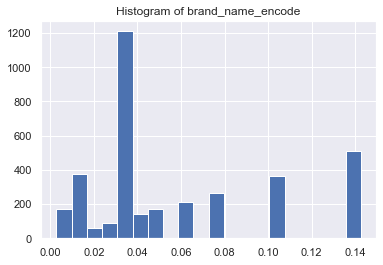

In [82]:
plt.hist(df['brand_name_encode'], 20)
plt.title('Histogram of brand_name_encode')
plt.show()

<AxesSubplot:>

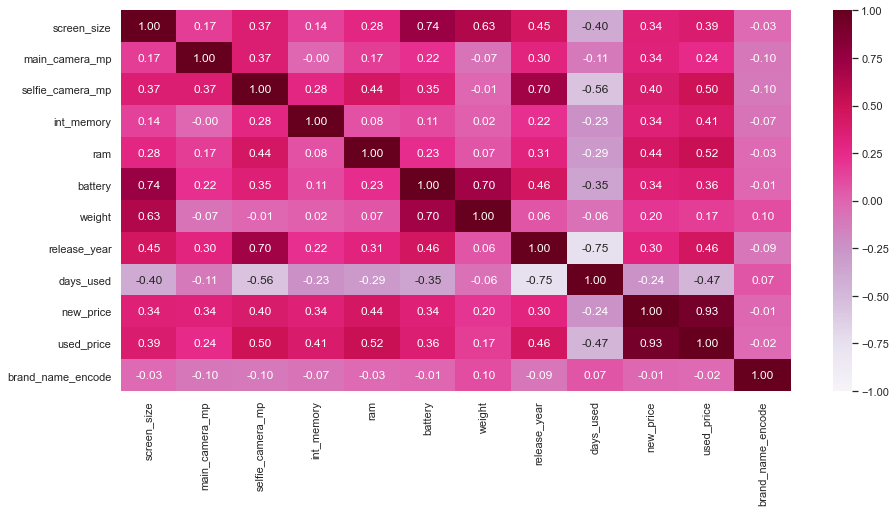

In [83]:
# heatmap of cell data to show correlation between numeric variables
numeric_columns = df.select_dtypes(include=np.number).columns.tolist()
#numeric_columns.remove("Year")  # dropping year column as it is temporal variable
plt.figure(figsize=(15,7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt='.2f', cmap='PuRd')

## Outlier Treatment on Numeric Variables: ram, screen_size and weight

### 1. ram

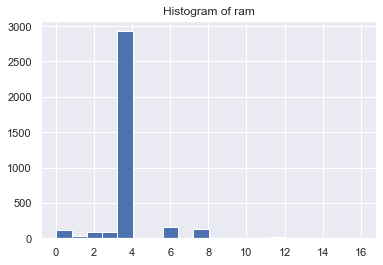

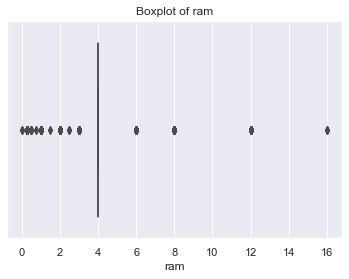

In [84]:
plt.hist(df['ram'], 20)
plt.title('Histogram of ram')
plt.show()

sns.boxplot(df['ram'])
plt.title('Boxplot of ram')
plt.show()

In [85]:
quartiles = np.quantile(df['ram'][df['ram'].notnull()], [.25, .75])
ram_4iqr = 4 * (quartiles[1] - quartiles[0])
print(f'Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 4*IQR = {ram_4iqr}')
outlier_ram = df.loc[np.abs(df['ram'] - df['ram'].median()) > ram_4iqr, 'ram']
outlier_ram.value_counts().sum()

Q1 = 4.0, Q3 = 4.0, 4*IQR = 0.0


643

Most of ram values are 4 so IQR=0. i dont want to loose the variance. So, essentially I need to put a filter on the data frame such that we select all rows where the values of a certain column are within, 3 standard deviations from mean.

In [86]:
# I'm copying the variable to a new variable.
df

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price,brand_name_encode
0,Honor,Android,60.880,yes,no,13.000,5.000,64.000,3.000,3020.000,146.000,2020,127,111.620,86.960,0.033
1,Honor,Android,71.370,yes,yes,13.000,16.000,128.000,8.000,4300.000,213.000,2020,325,249.390,161.490,0.033
2,Honor,Android,61.700,yes,yes,13.000,8.000,128.000,8.000,4200.000,213.000,2020,162,359.470,268.550,0.033
3,Honor,Android,66.140,yes,yes,13.000,8.000,64.000,6.000,7250.000,480.000,2020,345,278.930,180.230,0.033
4,Honor,Android,39.930,yes,no,13.000,8.000,64.000,3.000,5000.000,185.000,2020,293,140.870,103.800,0.033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,Asus,Android,40.340,yes,no,8.000,8.000,64.000,6.000,5000.000,190.000,2019,232,654.500,490.960,0.035
3567,Asus,Android,38.710,yes,no,13.000,8.000,128.000,8.000,4000.000,200.000,2018,541,518.814,259.300,0.035
3568,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,3.000,4000.000,165.000,2020,201,92.650,69.810,0.035
3569,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,2.000,4000.000,160.000,2020,149,101.915,76.070,0.035


* Taking Z-score of all ram to keep only values within 3 standard deviations of mean.

In [87]:
df.columns

Index(['brand_name', 'os', 'screen_size', 'four_g', 'five_g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price',
       'brand_name_encode'],
      dtype='object')

In [88]:
df5=df.copy()

In [89]:
#df=df5.copy()
#df=cell.copy()

In [90]:
#df

In [91]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3571 entries, 0 to 3570
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   brand_name         3571 non-null   category
 1   os                 3571 non-null   category
 2   screen_size        3571 non-null   float64 
 3   four_g             3571 non-null   category
 4   five_g             3571 non-null   category
 5   main_camera_mp     3571 non-null   float64 
 6   selfie_camera_mp   3571 non-null   float64 
 7   int_memory         3571 non-null   float64 
 8   ram                3571 non-null   float64 
 9   battery            3571 non-null   float64 
 10  weight             3571 non-null   float64 
 11  release_year       3571 non-null   int64   
 12  days_used          3571 non-null   int64   
 13  new_price          3571 non-null   float64 
 14  used_price         3571 non-null   float64 
 15  brand_name_encode  3571 non-null   float64 
dtypes: cat

In [92]:
df.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
brand_name,3571,34,Others,509,NaN,NaN,NaN,NaN,NaN,NaN,NaN
os,3571,4,Android,3246,NaN,NaN,NaN,NaN,NaN,NaN,NaN
screen_size,3571.000,NaN,NaN,NaN,37.602,13.088,6.860,32.260,34.260,41.940,117.750
four_g,3571,2,yes,2359,NaN,NaN,NaN,NaN,NaN,NaN,NaN
five_g,3571,2,no,3419,NaN,NaN,NaN,NaN,NaN,NaN,NaN
main_camera_mp,3571.000,NaN,NaN,NaN,9.330,4.705,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3571.000,NaN,NaN,NaN,6.546,6.878,0.300,2.000,5.000,8.000,32.000
int_memory,3571.000,NaN,NaN,NaN,54.470,84.586,0.005,16.000,32.000,64.000,1024.000
ram,3571.000,NaN,NaN,NaN,4.057,1.390,0.030,4.000,4.000,4.000,16.000
battery,3571.000,NaN,NaN,NaN,3066.105,1363.777,80.000,2100.000,3000.000,4000.000,12000.000


In [93]:
from scipy import stats
df=df[np.abs(df.ram-df.ram.mean()) <= (3*df.ram.std())]
# keep only the ones that are within +3 to -3 standard deviations in the column 'ram'.

In [94]:
# calculating z scores of all variables
#from scipy import stats
#cols_z_score = ['screen_size','main_camera_mp','selfie_camera_mp','new_price', 
#               'battery','weight','int_memory','days_used', 'ram']
#df=df[(np.abs(stats.zscore(df[cols_z_score])) < 3).all(axis=1)]

In [95]:
df.ram.describe()

count   3549.000
mean       4.003
std        1.208
min        0.030
25%        4.000
50%        4.000
75%        4.000
max        8.000
Name: ram, dtype: float64

In [96]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,3549.000,37.568,13.060,6.860,32.260,34.260,41.530,117.750
main_camera_mp,3549.000,9.334,4.713,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3549.000,6.477,6.812,0.300,2.000,5.000,8.000,32.000
int_memory,3549.000,53.362,82.694,0.005,16.000,32.000,64.000,1024.000
ram,3549.000,4.003,1.208,0.030,4.000,4.000,4.000,8.000
battery,3549.000,3062.109,1362.480,80.000,2100.000,3000.000,4000.000,12000.000
weight,3549.000,179.395,90.358,23.000,140.000,159.000,183.000,950.000
release_year,3549.000,2015.943,2.281,2013.000,2014.000,2015.000,2018.000,2020.000
days_used,3549.000,677.866,247.218,91.000,541.000,692.000,873.000,1094.000
new_price,3549.000,233.293,185.461,9.130,120.090,189.650,290.530,2560.200


In [97]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3549 entries, 0 to 3570
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   brand_name         3549 non-null   category
 1   os                 3549 non-null   category
 2   screen_size        3549 non-null   float64 
 3   four_g             3549 non-null   category
 4   five_g             3549 non-null   category
 5   main_camera_mp     3549 non-null   float64 
 6   selfie_camera_mp   3549 non-null   float64 
 7   int_memory         3549 non-null   float64 
 8   ram                3549 non-null   float64 
 9   battery            3549 non-null   float64 
 10  weight             3549 non-null   float64 
 11  release_year       3549 non-null   int64   
 12  days_used          3549 non-null   int64   
 13  new_price          3549 non-null   float64 
 14  used_price         3549 non-null   float64 
 15  brand_name_encode  3549 non-null   float64 
dtypes: cat

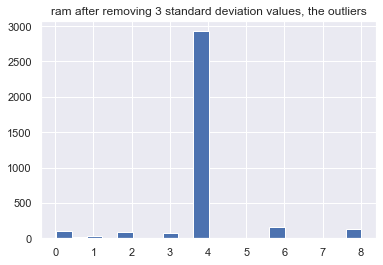

4.00305438151592
4.0


In [98]:
# histogram of ram after removing the outliers
df['ram'].hist(bins=20)
plt.title('ram after removing 3 standard deviation values, the outliers')
plt.show()
print(df['ram'].mean())
print(df['ram'].median())
plt.show()

In [99]:
#function to find values between 1.5* 0.25 and 1.5* 0.75 quartiles
def frac_outside_1pt5_IQR(x):
    length = 1.5 * np.diff(np.quantile(x, [.25, .75]))
    return np.mean(np.abs(x - np.median(x)) > length)

#print(frac_outside_1pt5_IQR(x1))
#print(frac_outside_1pt5_IQR(x2))

### 2. screen_size

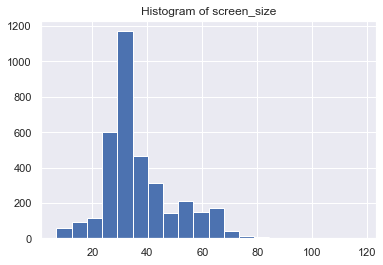

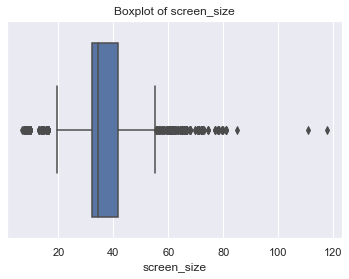

In [100]:
plt.hist(df['screen_size'], 20)
plt.title('Histogram of screen_size')
plt.show()

sns.boxplot(df['screen_size'])
plt.title('Boxplot of screen_size')
plt.show()

`screen_size` has a lot of values that are flagged as suspicious by the boxplot, but in the histogram we can see that the distribution is skewed but these huge points aren't consistent with the overall distribution of the data. Nevertheless, having a heavy tail means we might want to consider statistics less sensitive to large values, so e.g. the median may be a better measure of central tendancy. 

In [101]:
#values between  4* 0.25 and 4* 0.75 quartiles of screen_size
quartiles = np.quantile(df['screen_size'][df['screen_size'].notnull()], [.25, .75])
screen_4iqr = 4 * (quartiles[1] - quartiles[0])
print(f'Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 4*IQR = {screen_4iqr}')
outlier_screen = df.loc[np.abs(df['screen_size'] - df['screen_size'].median()) > screen_4iqr, 'screen_size']
outlier_screen

Q1 = 32.26, Q3 = 41.53, 4*IQR = 37.08000000000001


1       71.370
60      71.780
117     71.370
165     74.600
175     74.600
176     74.600
191     72.190
226     71.370
285     71.780
342     71.370
387    110.900
401     81.050
666     81.050
680     81.050
697     81.050
712     72.970
742     72.190
862     72.190
863     72.190
1077    72.190
1151    77.010
1157    72.190
1160    72.190
1192    78.640
1194    79.830
1196    77.010
1198    79.430
1345    72.190
1346    72.190
1347    72.190
1472    79.430
1549    77.010
1555    72.190
1609    78.230
1646    85.090
1873    72.190
2110    72.190
2362    79.430
2382    79.430
2562   117.750
2687    78.230
2688    78.230
2689    78.230
2690    78.230
2691    78.230
2692    78.230
2760    72.190
2958    72.190
3033    71.370
3044    72.190
3054    72.190
3055    72.190
3056    72.190
3057    72.190
3058    72.190
3059    72.190
3065    72.190
3178    72.190
3439    72.190
Name: screen_size, dtype: float64

* These screen sizes which are already converted to inches are too big to be a cell phone, so i am deleting the records which are outside the 4* IQR range as they are few records

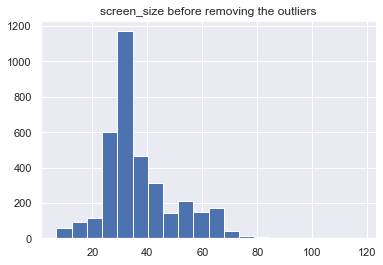

37.567548605240475


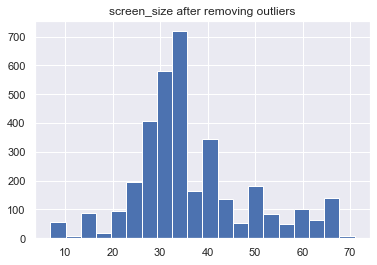

In [102]:
# keeping only IQR * 4 values of screen_size and replacing outliers with median
df['screen_size'].hist(bins=20)
plt.title('screen_size before removing the outliers')
plt.show()
print(df['screen_size'].mean())
# if we wanted to make these NA we could just do this
# [not run]
df.loc[np.abs(df['screen_size'] - df['screen_size'].median()) > screen_4iqr, 'screen_size'] = np.nan
df['screen_size'].hist(bins=20)
plt.title('screen_size after removing outliers')
plt.show()

* Converting these outliers to nan and later on dropping the records.

In [103]:
# dropping these rows
df.drop(outlier_screen.index, axis=0, inplace=True)

In [104]:
screen = df['screen_size'][df['screen_size'].notnull()]

print(screen.mean())  # the mean and median look close
print(screen.median())

36.91476504297951
34.26


In [105]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3490 entries, 0 to 3570
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   brand_name         3490 non-null   category
 1   os                 3490 non-null   category
 2   screen_size        3490 non-null   float64 
 3   four_g             3490 non-null   category
 4   five_g             3490 non-null   category
 5   main_camera_mp     3490 non-null   float64 
 6   selfie_camera_mp   3490 non-null   float64 
 7   int_memory         3490 non-null   float64 
 8   ram                3490 non-null   float64 
 9   battery            3490 non-null   float64 
 10  weight             3490 non-null   float64 
 11  release_year       3490 non-null   int64   
 12  days_used          3490 non-null   int64   
 13  new_price          3490 non-null   float64 
 14  used_price         3490 non-null   float64 
 15  brand_name_encode  3490 non-null   float64 
dtypes: cat

### 3. weight

`weight` has a lot of values that are flagged as suspicious by the boxplot, but in the histogram we can see that the distribution is skewed. Nevertheless, having a heavy tail means we might want to consider statistics less sensitive to large values, so e.g. the median may be a better measure of central tendancy. 

In [106]:
quartiles = np.quantile(df['weight'][df['weight'].notnull()], [.25, .75])
weight_3iqr = 3 * (quartiles[1] - quartiles[0])
print(f'Q1 = {quartiles[0]}, Q3 = {quartiles[1]}, 3*IQR = {weight_3iqr}')
outlier_weight = df.loc[np.abs(df['weight'] - df['weight'].median()) > weight_3iqr, 'weight']
outlier_weight

Q1 = 140.0, Q3 = 183.0, 3*IQR = 129.0


3      480.000
22     453.600
32     310.000
34     450.000
37     460.000
         ...  
3162   469.000
3320   300.000
3392   290.000
3393   290.000
3463   300.000
Name: weight, Length: 307, dtype: float64

In [107]:
# dropping these rows
df.drop(outlier_weight.index, axis=0, inplace=True)

In [108]:
df.shape

(3183, 16)

In [109]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,3183.000,35.224,10.886,7.260,28.630,33.070,39.520,70.970
main_camera_mp,3183.000,9.645,4.704,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3183.000,6.772,6.970,0.300,2.000,5.000,8.000,32.000
int_memory,3183.000,54.143,81.624,0.005,16.000,32.000,64.000,1024.000
ram,3183.000,4.011,1.227,0.030,4.000,4.000,4.000,8.000
battery,3183.000,2836.169,1065.845,80.000,2000.000,2900.000,3500.000,8220.000
weight,3183.000,155.412,34.188,30.000,138.700,155.000,174.000,285.000
release_year,3183.000,2015.983,2.269,2013.000,2014.000,2016.000,2018.000,2020.000
days_used,3183.000,676.501,248.444,91.000,537.000,692.000,872.000,1094.000
new_price,3183.000,227.273,174.271,9.130,118.992,181.040,280.925,1751.180


## Treating Outliers of the rest of the numeric variables

- Outliers in the data would be treated by flooring and capping.

In [110]:
# function to treat outliers by converting 
def treat_outliers(df, col):
    """
    treats outliers in a variable
    col: str, name of the numerical variable
    df: dataframe
    col: name of the column
    """
    Q1 = df[col].quantile(0.25)  # 25th quantile
    Q3 = df[col].quantile(0.75)  # 75th quantile
    IQR = Q3 - Q1
    Lower_Whisker = Q1 - 1.5 * IQR
    Upper_Whisker = Q3 + 1.5 * IQR
    #Lower_Whisker = Q1 - 3 * IQR
    #Upper_Whisker = Q3 + 3 * IQR
    # all the values smaller than Lower_Whisker will be assigned the value of Lower_Whisker
    # all the values greater than Upper_Whisker will be assigned the value of Upper_Whisker
    df[col] = np.clip(df[col], Lower_Whisker, Upper_Whisker)

    return df


#def treat_outliers_all(df, col_list):
    """
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    """
#    for c in col_list:
#        df = treat_outliers(df, c)

#    return df

- max screen size is still very big. 
- other numeric variables also need outliers removal

In [111]:
df.columns

Index(['brand_name', 'os', 'screen_size', 'four_g', 'five_g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price',
       'brand_name_encode'],
      dtype='object')

<Figure size 1080x360 with 0 Axes>

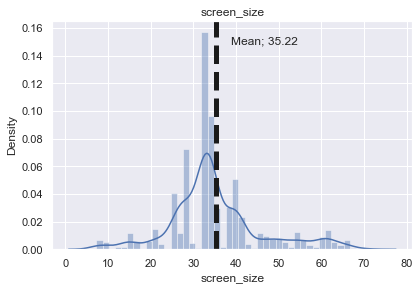

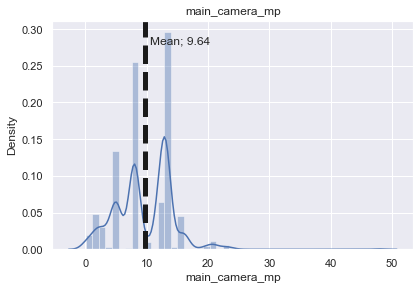

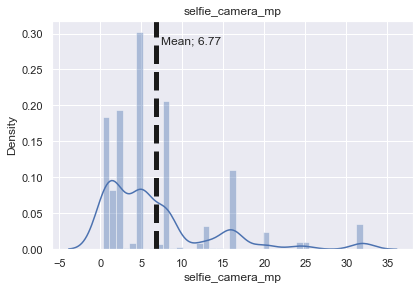

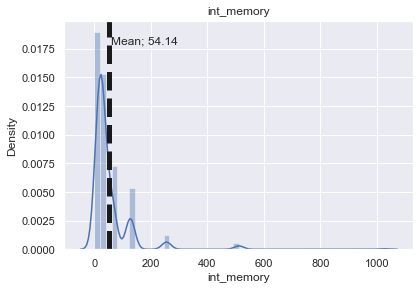

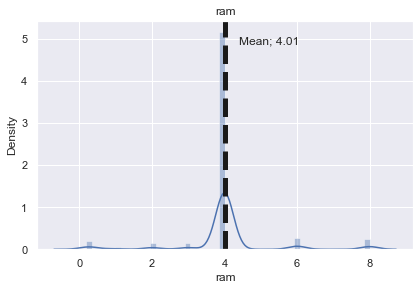

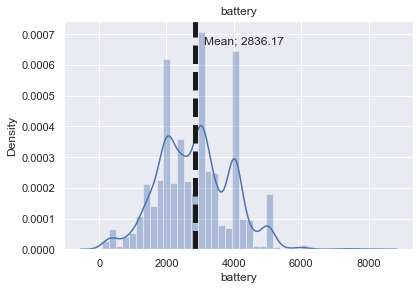

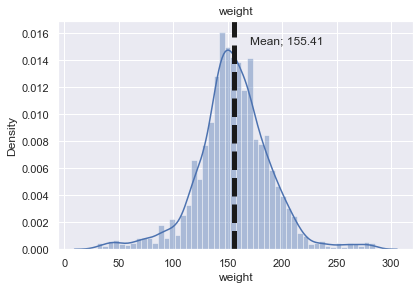

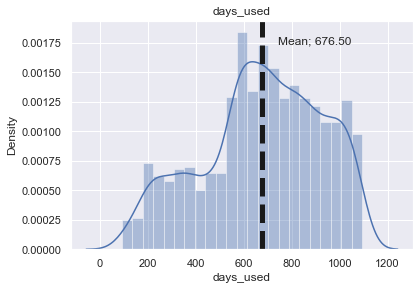

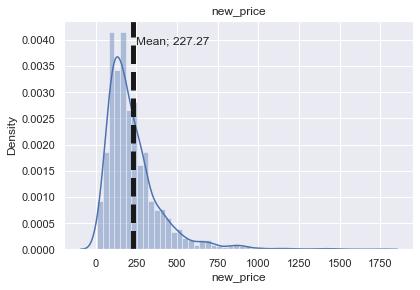

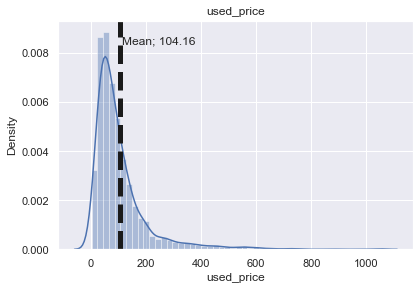

In [112]:
#BOXPLOTS before outlier removal
# let's plot the boxplots of all columns to check for outliers
numeric_columns=['screen_size','main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
        'days_used', 'new_price', 'used_price']#'release_year',
plt.figure(figsize=(15, 5))

for i, variable in enumerate(numeric_columns):
    #plt.subplot(5, 2, i + 1)
    #plt.boxplot(df[variable], whis=1.5)
    # plot distribution of selfie_camera_mp of used phones
    plot_distribution(df[variable])
    plt.tight_layout()
    plt.title(variable)
    plt.show()

In [113]:
# treating the outliers
#numerical_col = df.select_dtypes(include=np.number).columns.tolist()
#df = treat_outliers_all(df, numerical_col)

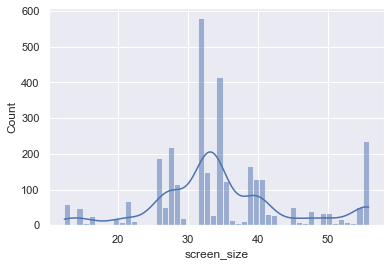

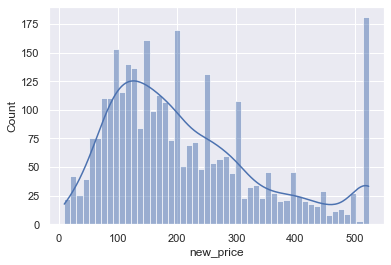

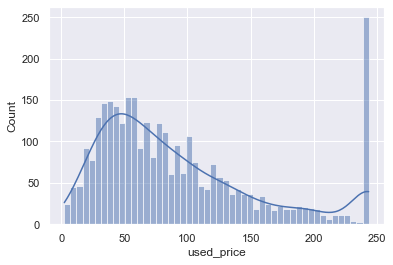

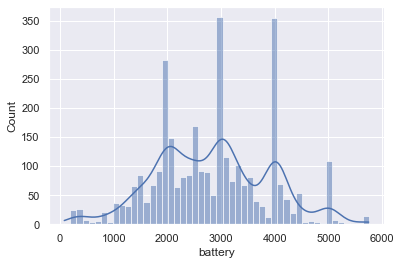

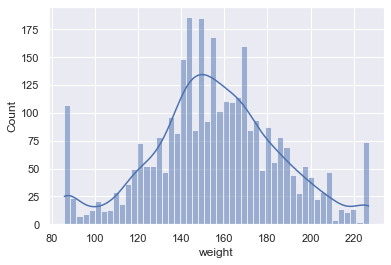

In [114]:
# distributions after treating outliers
cols_to_ol = ['screen_size','new_price', 'used_price','battery','weight']# 'ram',],'release_year',,'days_used','int_memory''main_camera_mp','selfie_camera_mp',
for colname in cols_to_ol:
    df = treat_outliers(df, colname) # applying outlier removal function
    sns.histplot(df[colname], bins=50, kde=True)
    plt.show()
    #def treat_outliers_all(df, col_list):
    """
    treat outlier in all numerical variables
    col_list: list of numerical variables
    df: data frame
    """
#    for c in col_list:
#        df = treat_outliers(df, c)

#    return df

* The distributions are less skewed now after removing outliers

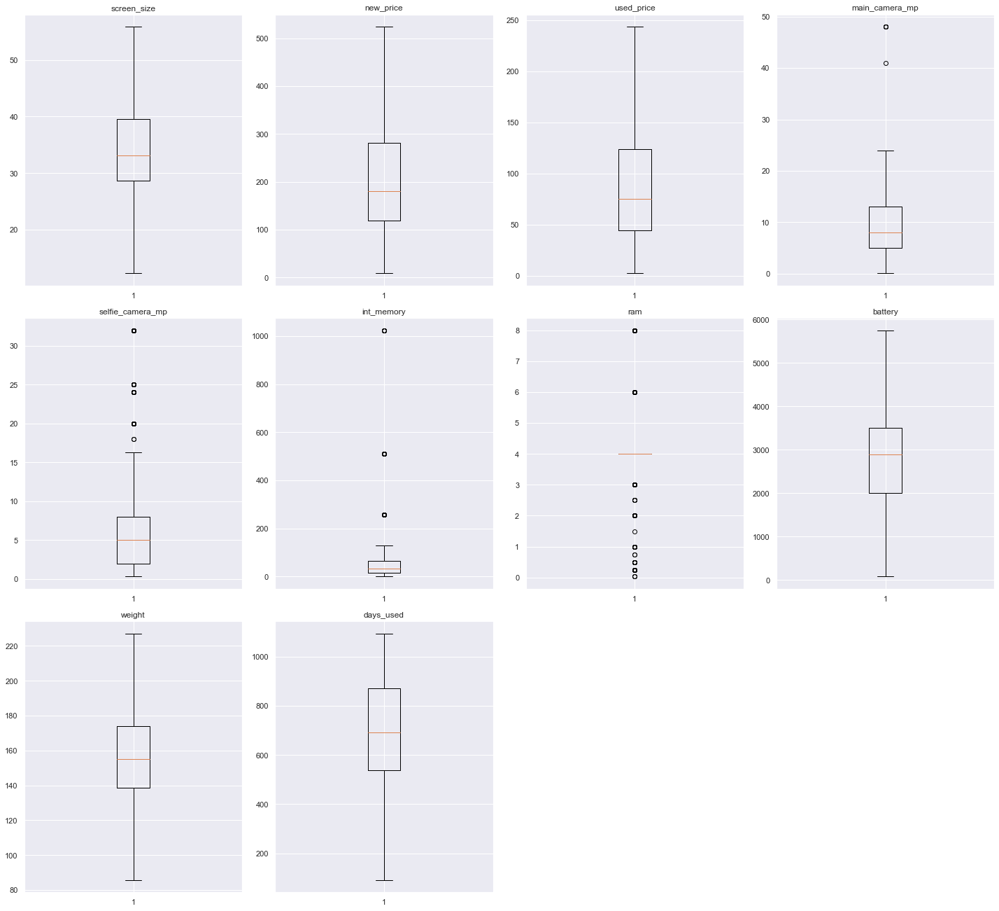

In [115]:
#BOXPLOT after outliers removal
# let's plot the boxplots of all columns to check for outliers
numeric_columns=['screen_size','new_price','used_price','main_camera_mp','selfie_camera_mp','int_memory','ram','battery','weight','days_used']
plt.figure(figsize=(20, 30))

for i, variable in enumerate(numeric_columns):
    plt.subplot(5, 4, i + 1)
    plt.boxplot(df[variable], whis=1.5)
    plt.tight_layout()
    plt.title(variable)

plt.show()

In [116]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3183 entries, 0 to 3570
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype   
---  ------             --------------  -----   
 0   brand_name         3183 non-null   category
 1   os                 3183 non-null   category
 2   screen_size        3183 non-null   float64 
 3   four_g             3183 non-null   category
 4   five_g             3183 non-null   category
 5   main_camera_mp     3183 non-null   float64 
 6   selfie_camera_mp   3183 non-null   float64 
 7   int_memory         3183 non-null   float64 
 8   ram                3183 non-null   float64 
 9   battery            3183 non-null   float64 
 10  weight             3183 non-null   float64 
 11  release_year       3183 non-null   int64   
 12  days_used          3183 non-null   int64   
 13  new_price          3183 non-null   float64 
 14  used_price         3183 non-null   float64 
 15  brand_name_encode  3183 non-null   float64 
dtypes: cat

In [117]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
screen_size,3183.000,34.886,9.776,12.295,28.630,33.070,39.520,55.855
main_camera_mp,3183.000,9.645,4.704,0.080,5.000,8.000,13.000,48.000
selfie_camera_mp,3183.000,6.772,6.970,0.300,2.000,5.000,8.000,32.000
int_memory,3183.000,54.143,81.624,0.005,16.000,32.000,64.000,1024.000
ram,3183.000,4.011,1.227,0.030,4.000,4.000,4.000,8.000
battery,3183.000,2832.600,1053.551,80.000,2000.000,2900.000,3500.000,5750.000
weight,3183.000,155.531,30.319,85.750,138.700,155.000,174.000,226.950
release_year,3183.000,2015.983,2.269,2013.000,2014.000,2016.000,2018.000,2020.000
days_used,3183.000,676.501,248.444,91.000,537.000,692.000,872.000,1094.000
new_price,3183.000,214.695,130.190,9.130,118.992,181.040,280.925,523.825


* Outliers are removed from all the numeric variables which can be seen from boxplot 
* Also from the dataset summary. Mean and median of all variables are quite close now. 

# Standardizing continuous features

In [118]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler

In [119]:
df.columns

Index(['brand_name', 'os', 'screen_size', 'four_g', 'five_g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price',
       'brand_name_encode'],
      dtype='object')

### Standard scaler

In [120]:
df_cell=df.copy()
df_cell

,brand_name,os,screen_size,four_g,five_g,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price,brand_name_encode
0,Honor,Android,55.855,yes,no,13.000,5.000,64.000,3.000,3020.000,146.000,2020,127,111.620,86.960,0.033
2,Honor,Android,55.855,yes,yes,13.000,8.000,128.000,8.000,4200.000,213.000,2020,162,359.470,243.405,0.033
4,Honor,Android,39.930,yes,no,13.000,8.000,64.000,3.000,5000.000,185.000,2020,293,140.870,103.800,0.033
5,Honor,Android,54.430,yes,no,13.000,8.000,64.000,4.000,4000.000,176.000,2020,223,157.700,113.670,0.033
6,Honor,Android,50.390,yes,no,8.000,5.000,32.000,2.000,3020.000,144.000,2020,234,91.740,72.290,0.033
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,Asus,Android,40.340,yes,no,8.000,8.000,64.000,6.000,5000.000,190.000,2019,232,523.825,243.405,0.035
3567,Asus,Android,38.710,yes,no,13.000,8.000,128.000,8.000,4000.000,200.000,2018,541,518.814,243.405,0.035
3568,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,3.000,4000.000,165.000,2020,201,92.650,69.810,0.035
3569,Alcatel,Android,47.570,yes,no,13.000,5.000,32.000,2.000,4000.000,160.000,2020,149,101.915,76.070,0.035


In [121]:
df.columns

Index(['brand_name', 'os', 'screen_size', 'four_g', 'five_g', 'main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
       'release_year', 'days_used', 'new_price', 'used_price',
       'brand_name_encode'],
      dtype='object')

**Observations**

* The distribution of used_price is heavily skewed to the right.
* The outliers to the right indicate that many cell phones, though used,  have a very high Prices.
* Mean is 109.9 much greater than median due to extreme values towards higher end.
* There are a lot of outliers towards right, larger side.Majority of values 50% are between 45 and 126

In [122]:
# A copy of the scaled df
#df=df_cell.copy()

## Encoding rest of Categorical Variable

In [123]:
df=pd.get_dummies(df, columns=['four_g'])
df=pd.get_dummies(df, columns=['five_g'])
df=pd.get_dummies(df, columns=['os'])

#df_cell=df_cell.drop('os_others' , axis=1,inplace=True)
print(df.sample(10))

     brand_name  screen_size  main_camera_mp  selfie_camera_mp  int_memory  \
2541    Samsung       35.080          16.000             8.000      32.000   
607      Others       34.260          13.000             5.000      16.000   
2395     Others       32.260           8.000             2.000      32.000   
1715         LG       34.260          13.000             5.000      64.000   
2314  Panasonic       32.260           8.000             5.000      16.000   
2357     Others       25.810           8.000             0.300      16.000   
551     Alcatel       16.130           3.150             0.300      16.000   
3441        ZTE       55.855           8.000             8.000     128.000   
2859       Sony       28.220           8.000             0.300      32.000   
2589    Samsung       14.530           3.150             5.000     256.000   

       ram  battery  weight  release_year  days_used  ...  used_price  \
2541 4.000 3300.000 169.000          2016        772  ...     100.68

In [124]:
#df['brand_name_enc']

In [125]:
#df=pd.get_dummies(df, columns=['os'])

#df_cell=pd.get_dummies(df_cell, columns=['os'])
#df_cell.drop(['brand_name', 'os_Others'],axis=1,inplace=True)
#df_cell=df_cell.drop('os_others' , axis=1,inplace=True)
print(df.sample(10))

     brand_name  screen_size  main_camera_mp  selfie_camera_mp  int_memory  \
2260       Oppo       32.260          13.000             8.000      16.000   
3569    Alcatel       47.570          13.000             5.000      32.000   
1279        HTC       25.810           5.000             0.300      16.000   
3294        ZTE       25.810           5.000             0.300      16.000   
1010     Celkon       21.360           2.000             0.300     256.000   
1156      Honor       35.080          13.000             8.000      32.000   
3269        ZTE       35.080           8.000             1.600      16.000   
800        Asus       32.260          13.000             5.000      32.000   
620      Others       25.810           3.150             0.300      16.000   
2826       Sony       32.260           5.000             2.000      32.000   

       ram  battery  weight  release_year  days_used  ...  used_price  \
2260 4.000 2320.000 147.000          2015        909  ...      75.15

In [126]:
df.drop(['brand_name', 'os_Windows','four_g_no','five_g_yes'],axis=1,inplace=True)

In [127]:
df

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,used_price,brand_name_encode,four_g_yes,five_g_no,os_Android,os_Others,os_iOS
0,55.855,13.000,5.000,64.000,3.000,3020.000,146.000,2020,127,111.620,86.960,0.033,1,1,1,0,0
2,55.855,13.000,8.000,128.000,8.000,4200.000,213.000,2020,162,359.470,243.405,0.033,1,0,1,0,0
4,39.930,13.000,8.000,64.000,3.000,5000.000,185.000,2020,293,140.870,103.800,0.033,1,1,1,0,0
5,54.430,13.000,8.000,64.000,4.000,4000.000,176.000,2020,223,157.700,113.670,0.033,1,1,1,0,0
6,50.390,8.000,5.000,32.000,2.000,3020.000,144.000,2020,234,91.740,72.290,0.033,1,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3566,40.340,8.000,8.000,64.000,6.000,5000.000,190.000,2019,232,523.825,243.405,0.035,1,1,1,0,0
3567,38.710,13.000,8.000,128.000,8.000,4000.000,200.000,2018,541,518.814,243.405,0.035,1,1,1,0,0
3568,47.570,13.000,5.000,32.000,3.000,4000.000,165.000,2020,201,92.650,69.810,0.035,1,1,1,0,0
3569,47.570,13.000,5.000,32.000,2.000,4000.000,160.000,2020,149,101.915,76.070,0.035,1,1,1,0,0


In [128]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 3183 entries, 0 to 3570
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   screen_size        3183 non-null   float64
 1   main_camera_mp     3183 non-null   float64
 2   selfie_camera_mp   3183 non-null   float64
 3   int_memory         3183 non-null   float64
 4   ram                3183 non-null   float64
 5   battery            3183 non-null   float64
 6   weight             3183 non-null   float64
 7   release_year       3183 non-null   int64  
 8   days_used          3183 non-null   int64  
 9   new_price          3183 non-null   float64
 10  used_price         3183 non-null   float64
 11  brand_name_encode  3183 non-null   float64
 12  four_g_yes         3183 non-null   uint8  
 13  five_g_no          3183 non-null   uint8  
 14  os_Android         3183 non-null   uint8  
 15  os_Others          3183 non-null   uint8  
 16  os_iOS             3183 

In [129]:
df.columns

Index(['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',
       'used_price', 'brand_name_encode', 'four_g_yes', 'five_g_no',
       'os_Android', 'os_Others', 'os_iOS'],
      dtype='object')

## EDA

- It is a good idea to explore the data once again after manipulating it.

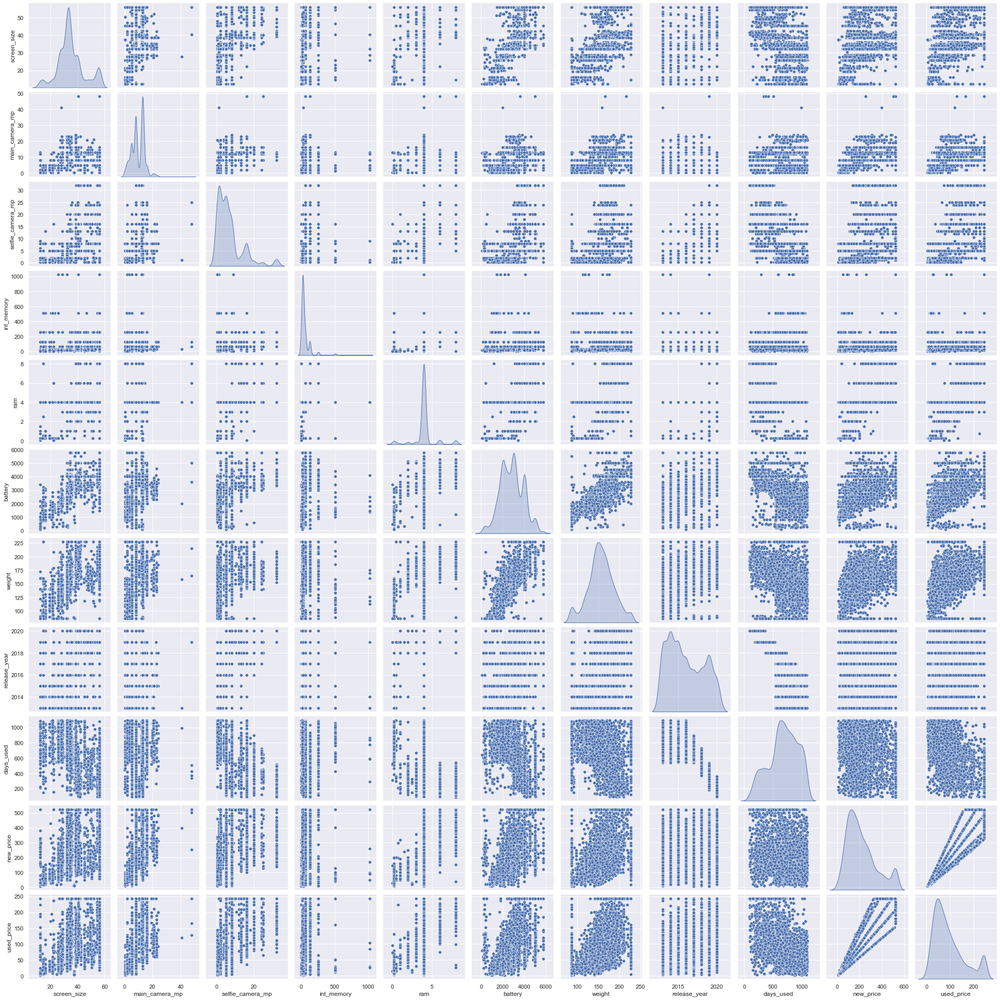

In [130]:
# pairplot of numeric variables
sns.pairplot(df.iloc[:, 0:11], diag_kind='kde')   # to plot density curve instead of histogram on the diag

In [131]:
df.columns

Index(['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',
       'used_price', 'brand_name_encode', 'four_g_yes', 'five_g_no',
       'os_Android', 'os_Others', 'os_iOS'],
      dtype='object')

In [132]:
df.columns

Index(['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',
       'used_price', 'brand_name_encode', 'four_g_yes', 'five_g_no',
       'os_Android', 'os_Others', 'os_iOS'],
      dtype='object')

## Building a Linear Regression model

### Splitting target variable from Predictors

In [133]:
# defining X and y variables
X = df.drop(["used_price"], axis=1)
y = df["used_price"]

print(X.head())
print(y.head())

   screen_size  main_camera_mp  selfie_camera_mp  int_memory   ram  battery  \
0       55.855          13.000             5.000      64.000 3.000 3020.000   
2       55.855          13.000             8.000     128.000 8.000 4200.000   
4       39.930          13.000             8.000      64.000 3.000 5000.000   
5       54.430          13.000             8.000      64.000 4.000 4000.000   
6       50.390           8.000             5.000      32.000 2.000 3020.000   

   weight  release_year  days_used  new_price  brand_name_encode  four_g_yes  \
0 146.000          2020        127    111.620              0.033           1   
2 213.000          2020        162    359.470              0.033           1   
4 185.000          2020        293    140.870              0.033           1   
5 176.000          2020        223    157.700              0.033           1   
6 144.000          2020        234     91.740              0.033           1   

   five_g_no  os_Android  os_Others  os_iOS 

In [134]:
X.columns

Index(['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',
       'brand_name_encode', 'four_g_yes', 'five_g_no', 'os_Android',
       'os_Others', 'os_iOS'],
      dtype='object')

In [135]:
# Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=1)

In [136]:
print("Number of rows in train data =", X_train.shape[0])
print("Number of rows in test data =", X_test.shape[0])

Number of rows in train data = 2228
Number of rows in test data = 955


## Normalised data of predicted variables

In [137]:
# data normalization with sklearn
from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(X_train)

# transform training data
X_train_norm = norm.transform(X_train)

# transform testing dataabs
X_test_norm = norm.transform(X_test)

* Normalising variables will transform distributions to more gaussian distribution or bell shape distribution.

probability plot of  screen_size


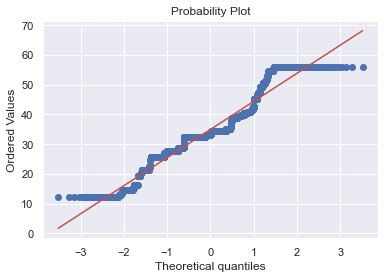

probability plot of  main_camera_mp


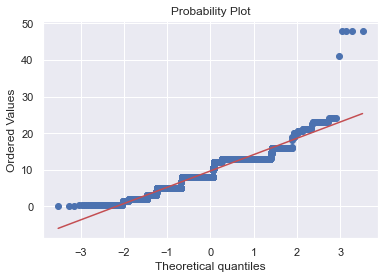

probability plot of  selfie_camera_mp


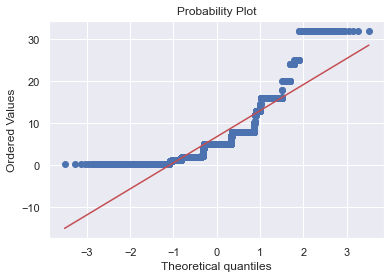

probability plot of  int_memory


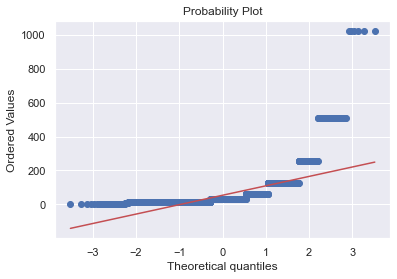

probability plot of  ram


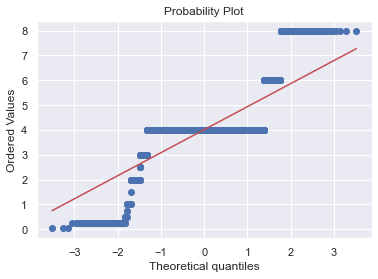

probability plot of  battery


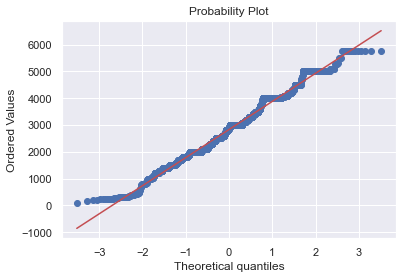

probability plot of  weight


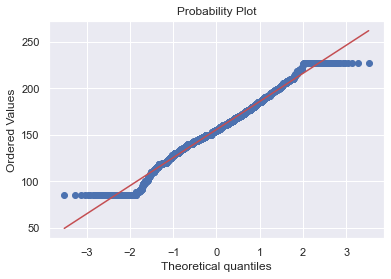

probability plot of  release_year


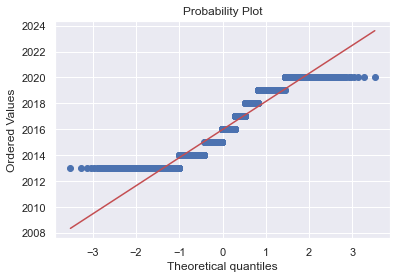

probability plot of  days_used


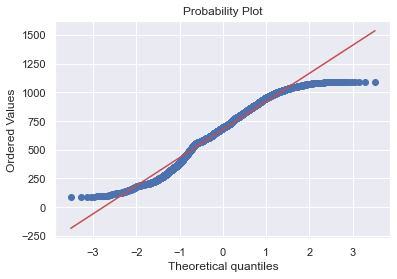

probability plot of  new_price


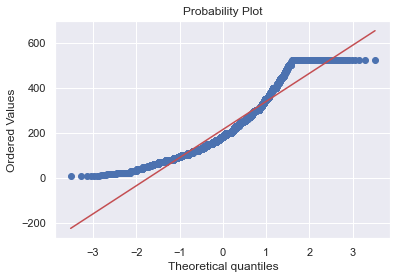

In [138]:
import pylab
import scipy.stats as stats
cols_to_mm = ['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',]#, 'release_year'
for colname in cols_to_mm:
    #df[colname+'_ss'] = StandardScaler().fit_transform(df[[colname]]) 
    print("probability plot of ", colname)
    stats.probplot(df[colname], dist="norm", plot=pylab)
    #sns.histplot(df[colname+'_ss'], bins=50, kde=True)
    plt.show()

#plt.show()

In [139]:
X_train.describe()

,screen_size,main_camera_mp,selfie_camera_mp,int_memory,ram,battery,weight,release_year,days_used,new_price,brand_name_encode,four_g_yes,five_g_no,os_Android,os_Others,os_iOS
count,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000,2228.000
mean,34.855,9.633,6.812,53.175,4.013,2825.934,155.691,2015.977,681.025,215.668,0.056,0.671,0.959,0.900,0.067,0.011
std,9.860,4.668,7.112,75.907,1.250,1051.836,30.551,2.271,250.557,131.716,0.043,0.470,0.199,0.300,0.250,0.103
min,12.295,0.080,0.300,0.005,0.030,80.000,85.750,2013.000,91.000,9.130,0.003,0.000,0.000,0.000,0.000,0.000
25%,28.630,6.650,2.000,16.000,4.000,2000.000,138.000,2014.000,535.000,118.627,0.031,0.000,1.000,1.000,0.000,0.000
50%,33.070,8.000,5.000,32.000,4.000,2855.000,155.000,2016.000,699.000,180.845,0.036,1.000,1.000,1.000,0.000,0.000
75%,39.520,13.000,8.000,64.000,4.000,3500.000,175.000,2018.000,881.000,288.643,0.074,1.000,1.000,1.000,0.000,0.000
max,55.855,48.000,32.000,1024.000,8.000,5750.000,226.950,2020.000,1094.000,523.825,0.143,1.000,1.000,1.000,1.000,1.000


### Standardizing numeric variables using standard scaler

In [140]:
# data standardization with  sklearn
from sklearn.preprocessing import StandardScaler

# copy of datasets
X_train_stand = X_train.copy()
X_test_stand = X_test.copy()

# numerical features
num_cols = ['screen_size','main_camera_mp',
       'selfie_camera_mp', 'int_memory', 'ram', 'battery', 'weight',
        'days_used', 'new_price']

# apply standardization on numerical features
for i in num_cols:
    
    # fit on training data column
    scale = StandardScaler().fit(X_train_stand[[i]])
    
    # transform the training data column
    X_train_stand[i] = scale.transform(X_train_stand[[i]])
    
    # transform the testing data column
    X_test_stand[i] = scale.transform(X_test_stand[[i]])

* Standardizing numeric variables will bring them all to similar scale, as they have quite different scales.

### Fitting Linear Regression model on train data set

In [141]:
# fit linear model
regression_model = LinearRegression()
regression_model.fit(X_train, y_train)

LinearRegression()

### Coefficients and intercept

In [142]:
coef_df = pd.DataFrame(
    np.append(regression_model.coef_, regression_model.intercept_),
    index=X_train.columns.tolist() + ["Intercept"],
    columns=["Coefficients"],
)

coef_df

,Coefficients
screen_size,0.105
main_camera_mp,-0.308
selfie_camera_mp,0.720
int_memory,0.025
ram,1.770
battery,-0.000
weight,0.011
release_year,0.161
days_used,-0.081
new_price,0.390


## Model performance evaluation

Let's check the performance of the model using different metrics.

We will be using metric functions defined in sklearn for RMSE, MAE, and  $R^2$ .

We will define a function to calculate MAPE and adjusted  $R^2$ .

The mean absolute percentage error (MAPE) measures the accuracy of predictions as a percentage, and can be calculated as the average absolute percent error for each predicted value minus actual values divided by actual values. It works best if there are no extreme values in the data and none of the actual values are 0.
We will create a function which will print out all the above metrics in one go.

In [143]:
# function to compute adjusted R-squared
def adj_r2_score(predictors, targets, predictions):
    r2 = r2_score(targets, predictions)
    n = predictors.shape[0]
    k = predictors.shape[1]
    return 1 - ((1 - r2) * (n - 1) / (n - k - 1))


# function to compute MAPE
def mape_score(targets, predictions):
    return np.mean(np.abs(targets - predictions) / targets) * 100


# function to compute different metrics to check performance of a regression model
def model_performance_regression(model, predictors, target):
    """
    Function to compute different metrics to check regression model performance

    model: regressor
    predictors: independent variables
    target: dependent variable
    """

    # predicting using the independent variables
    pred = model.predict(predictors)

    r2 = r2_score(target, pred)  # to compute R-squared
    adjr2 = adj_r2_score(predictors, target, pred)  # to compute adjusted R-squared
    rmse = np.sqrt(mean_squared_error(target, pred))  # to compute RMSE
    mae = mean_absolute_error(target, pred)  # to compute MAE
    mape = mape_score(target, pred)  # to compute MAPE

    # creating a dataframe of metrics
    df_perf = pd.DataFrame(
        {
            "RMSE": rmse,
            "MAE": mae,
            "R-squared": r2,
            "Adj. R-squared": adjr2,
            "MAPE": mape,
        },
        index=[0],
    )

    return df_perf

In [144]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
linearregression_train_perf = model_performance_regression(
    regression_model, X_train, y_train
)
linearregression_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,13.393,9.833,0.957,0.957,18.729


In [145]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
linearregression_test_perf = model_performance_regression(
    regression_model, X_test, y_test
)
linearregression_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,14.029,10.145,0.953,0.952,17.174


## Observations

The training  𝑅2  is 95.6%, indicating that the model explains 95.6% of the variation in the train data. So, the model is not underfitting.

MAE and RMSE on the train and test sets are comparable, which shows that the model is not overfitting.

MAE indicates that our current model is able to predict used phone prices  within a mean error of ~10 Euros on the test data.

MAPE on the test set suggests we can predict within ~20.6% of the used phone prices.

### Linear Regression using statsmodels
Let's build a linear regression model using statsmodels.

In [146]:
import statsmodels.api as sm
# unlike sklearn, statsmodels does not add a constant to the data on its own
# we have to add the constant manually
X_train1 = sm.add_constant(X_train)
# adding constant to the test data
X_test1 = sm.add_constant(X_test)

olsmod0 = sm.OLS(y_train, X_train1).fit()
print(olsmod0.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     3099.
Date:                Sat, 21 Aug 2021   Prob (F-statistic):               0.00
Time:                        09:46:03   Log-Likelihood:                -8942.4
No. Observations:                2228   AIC:                         1.792e+04
Df Residuals:                    2211   BIC:                         1.802e+04
Df Model:                          16                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const              -274.3657    529.27

#### p-value > 0.05 shows they are not significant and can be removed.

Observations

* Negative values of the coefficient show that used_price decreases with the increase of corresponding attribute value.

* Positive values of the coefficient show that used_price increases with the increase of corresponding attribute value.

* p-value of a variable indicates if the variable is significant or not. If we consider the significance level to be 0.05 (5%), then any variable with a p-value less than 0.05 would be considered significant.

* But these variables might contain multicollinearity, which will affect the p-values.

* So, we need to deal with multicollinearity and check the other assumptions of linear regression first, and then look at the p-values.

## Checking Linear Regression Assumptions

- In order to make statistical inferences from a linear regression model, it is important to ensure that the assumptions of linear regression are satisfied.

#### We will be checking the following Linear Regression assumptions:

1. No Multicollinearity

2. Linearity of variables

3. Independence of error terms

4. Normality of error terms

5. No Heteroscedasticity


### TEST FOR MULTICOLLINEARITY

* Multicollinearity occurs when predictor variables in a regression model are correlated. This correlation is a problem because predictor variables should be independent. 

* **Variance  Inflation Factor (VIF)**:  Variance inflation factors measure the inflation in the variances of the regression parameter estimates due to collinearities that exist among the predictors. 

* **General Rule of thumb**:
    - If VIF is between 1 and 5, then there is low multicollinearity.
    - If VIF is between 5 and 10, we say there is moderate multicollinearity.
    - If VIF is exceeding 10, it shows signs of high multicollinearity.

### Detecting Multicollinearity with VIF

In [147]:
df.columns

Index(['screen_size', 'main_camera_mp', 'selfie_camera_mp', 'int_memory',
       'ram', 'battery', 'weight', 'release_year', 'days_used', 'new_price',
       'used_price', 'brand_name_encode', 'four_g_yes', 'five_g_no',
       'os_Android', 'os_Others', 'os_iOS'],
      dtype='object')

In [148]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# we will define a function to check VIF
def checking_vif(predictors):
    vif = pd.DataFrame()
    vif["feature"] = predictors.columns

    # calculating VIF for each feature
    vif["VIF"] = [
        variance_inflation_factor(predictors.values, i)
        for i in range(len(predictors.columns))
    ]
    return vif

In [149]:
checking_vif(X_train1)

,feature,VIF
0,const,3453097.178
1,screen_size,3.042
2,main_camera_mp,1.826
3,selfie_camera_mp,2.689
4,int_memory,1.302
5,ram,1.972
6,battery,3.773
7,weight,2.535
8,release_year,4.377
9,days_used,2.536


release_years have VIF slightly greater than 5.But it is a temporal variable
This variable are correlated with each other.

### 1.Removing Multicollinearity
To remove multicollinearity

1. Drop every column one by one that has a VIF score greater than 5.
2. Look at the adjusted R-squared and RMSE of all these models.
3. Drop the variable that makes the least change in adjusted R-squared.
4. Check the VIF scores again.
5. Continue till you get all VIF scores under 5.
6. Let's define a function that will help us do this.

In [150]:
# function to treat multicollinearity
def treating_multicollinearity(predictors, target, high_vif_columns):
    """
    Checking the effect of dropping the columns showing high multicollinearity
    on model performance (adj. R-squared and RMSE)

    predictors: independent variables
    target: dependent variable
    high_vif_columns: columns having high VIF
    """
    # empty lists to store adj. R-squared and RMSE values
    adj_r2 = []
    rmse = []

    # build ols models by dropping one of the high VIF columns at a time
    # store the adjusted R-squared and RMSE in the lists defined previously
    for cols in high_vif_columns:
        # defining the new train set
        train = predictors.loc[:, ~predictors.columns.str.startswith(cols)]

        # create the model
        olsmodel = sm.OLS(target, train).fit()

        # adding adj. R-squared and RMSE to the lists
        adj_r2.append(olsmodel.rsquared_adj)
        rmse.append(np.sqrt(olsmodel.mse_resid))

    # creating a dataframe for the results
    temp = pd.DataFrame(
        {
            "col": high_vif_columns,
            "Adj. R-squared after_dropping col": adj_r2,
            "RMSE after dropping col": rmse,
        }
    ).sort_values(by="Adj. R-squared after_dropping col", ascending=False)
    temp.reset_index(drop=True, inplace=True)

    return temp

In [151]:
# check Adjusted R^2 and RMSE after dropping variables having p>0.05
col_list = ['release_year','screen_size','main_camera_mp' , 'battery', 'weight' ]

res = treating_multicollinearity(X_train1, y_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,release_year,0.957,13.442
1,weight,0.957,13.443
2,battery,0.957,13.444
3,screen_size,0.957,13.454
4,main_camera_mp,0.957,13.483


The above predictors have no multicollinearity and the assumption is satisfied.

Let's check the model performance.

In [152]:
# checking VIF after dropping columns having p>0.05
col_to_drop ='release_year','screen_size','main_camera_mp'   , 'battery', 'weight'       
X_train2 = X_train1.loc[:, ~X_train1.columns.str.startswith(col_to_drop)]
X_test2 = X_test1.loc[:, ~X_test1.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(X_train2)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  ('release_year', 'screen_size', 'main_camera_mp', 'battery', 'weight')


,feature,VIF
0,const,141.316
1,selfie_camera_mp,2.144
2,int_memory,1.263
3,ram,1.946
4,days_used,1.586
5,new_price,1.821
6,brand_name_encode,1.039
7,four_g_yes,1.584
8,five_g_no,1.637
9,os_Android,4.264


* No significant multicolinearity is present among variables.

#### Regression Evaluation Metrics
Regression Model will be evaluated using the following evaluation metrics:

* Mean Absolute Error (MAE) is the mean of the absolute value of the errors:

$$\frac 1n\sum_{i=1}^n|y_i-\hat{y}_i|$$
* Mean Squared Error (MSE) is the mean of the squared errors:

$$\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2$$
* Root Mean Squared Error (RMSE) is the square root of the mean of the squared errors:

$$\sqrt{\frac 1n\sum_{i=1}^n(y_i-\hat{y}_i)^2}$$

In [153]:
# fitting model again after dropping required variables
olsmod1 = sm.OLS(y_train, X_train2).fit()
print(olsmod1.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     4475.
Date:                Sat, 21 Aug 2021   Prob (F-statistic):               0.00
Time:                        09:46:03   Log-Likelihood:                -8952.6
No. Observations:                2228   AIC:                         1.793e+04
Df Residuals:                    2216   BIC:                         1.800e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
                        coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------------
const                55.4671      3.39

Observations

- We can see that adj. R-squared has remained .995, which shows that the dropped columns did not have much effect on the model.
- As there is no multicollinearity, we can look at the p-values of predictor variables to check their significance.
- 'five_g_no','os_Others','os_Android' ,'brand_name_encode' have p-value > 0.05. So, they are not significant and we'll drop them.
- But sometimes p-values change after dropping a variable. So, we'll not drop all variables at once.
- Instead, we will do the following:
    1. Build a model, check the p-values of the variables, and drop the column with the highest p-value.
    2. Create a new model without the dropped feature, check the p-values of the variables, and drop the column with the highest p-value.
    3. Repeat the above two steps till there are no columns with p-value > 0.05.
    4. The above process can also be done manually by picking one variable at a time that has a high p-value, dropping it, and building a model again. But that might be a little tedious and using a loop will be more efficient.

In [154]:
# check Adjusted R^2 and RMSE after dropping variables with p>0.05
col_list = ['five_g_no','os_Others','os_Android' ,'brand_name_encode']

res = treating_multicollinearity(X_train2, y_train, col_list)
res

,col,Adj. R-squared after_dropping col,RMSE after dropping col
0,os_Others,0.957,13.488
1,brand_name_encode,0.957,13.488
2,os_Android,0.957,13.489
3,five_g_no,0.957,13.493


The above predictors have no multicollinearity and the assumption is satisfied.

Let's check the model performance.

In [155]:
# check Adjusted R^2 and RMSE after dropping variables
col_to_drop ='five_g_no','os_Others','os_Android','brand_name_encode'
X_train3 = X_train2.loc[:, ~X_train2.columns.str.startswith(col_to_drop)]
X_test3 = X_test2.loc[:, ~X_test2.columns.str.startswith(col_to_drop)]

# Check VIF now
vif = checking_vif(X_train3)
print("VIF after dropping ", col_to_drop)
vif

VIF after dropping  ('five_g_no', 'os_Others', 'os_Android', 'brand_name_encode')


,feature,VIF
0,const,32.244
1,selfie_camera_mp,2.122
2,int_memory,1.192
3,ram,1.498
4,days_used,1.499
5,new_price,1.770
6,four_g_yes,1.492
7,os_iOS,1.078


* No significant multicollinearity

In [156]:
# initial list of columns
cols = X_train3.columns.tolist()

# setting an initial max p-value
max_p_value = 1

while len(cols) > 0:
    # defining the train set
    x_train_aux = X_train3[cols]

    # fitting the model
    model = sm.OLS(y_train, x_train_aux).fit()

    # getting the p-values and the maximum p-value
    p_values = model.pvalues
    max_p_value = max(p_values)

    # name of the variable with maximum p-value
    feature_with_p_max = p_values.idxmax()

    if max_p_value > 0.05:
        cols.remove(feature_with_p_max)
    else:
        break

selected_features = cols
print(selected_features)

['const', 'selfie_camera_mp', 'int_memory', 'ram', 'days_used', 'new_price', 'four_g_yes', 'os_iOS']


In [157]:
# train data with only selected columns
x_train4 = X_train3[selected_features]
x_test4 = X_test3[selected_features]

In [158]:
# fitting model on train data after dropping required columns
olsmod2 = sm.OLS(y_train, x_train4).fit()
print(olsmod2.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     7032.
Date:                Sat, 21 Aug 2021   Prob (F-statistic):               0.00
Time:                        09:46:03   Log-Likelihood:                -8954.6
No. Observations:                2228   AIC:                         1.793e+04
Df Residuals:                    2220   BIC:                         1.797e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               53.5010      1.623  

**Now no feature has p-value greater than 0.05, so we'll consider the features in *x_train4* as the final ones and *olsmod2* as final model.**

**Observations**

* Now adjusted R-squared is 0.955, i.e., our model is able to explain ~96% of the variance. This shows that the model is good.
* The adjusted R-squared in *olsmod0* (where we considered all the variables) was 0.955. This shows that the variables we dropped were not affecting the model much.

# Other Assumptions of Linear regression

**Now we'll check the rest of the assumptions on *olsmod2*.**

1. **Linearity of variables** & **Independence of error terms**

2. **Normality of error terms**

3. **No Heteroscedasticity**

## 1. Linearity of variables & Independence of error terms

In [159]:
# let us create a dataframe with actual, fitted and residual values
df_pred = pd.DataFrame()

df_pred["Actual Values"] = y_train  # actual values
df_pred["Fitted Values"] = olsmod2.fittedvalues  # predicted values
df_pred["Residuals"] = olsmod2.resid  # residuals

df_pred.head()

,Actual Values,Fitted Values,Residuals
774,64.310,70.863,-6.553
1235,135.390,119.862,15.528
2076,120.000,115.983,4.017
989,30.060,16.624,13.436
3106,91.810,101.476,-9.666


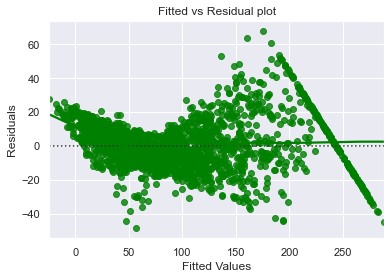

In [160]:
# let's plot the fitted values vs residuals

sns.residplot(
    data=df_pred, x="Fitted Values", y="Residuals", color="green", lowess=True
)
plt.xlabel("Fitted Values")
plt.ylabel("Residuals")
plt.title("Fitted vs Residual plot")
plt.show()

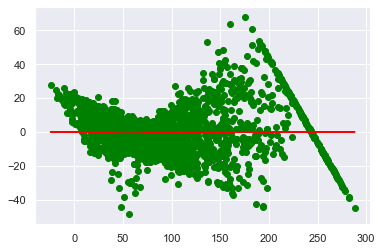

In [161]:
plt.plot(df_pred["Fitted Values"], df_pred["Residuals"], 'o', color='green')

#obtain m (slope) and b(intercept) of linear regression line
m, b = np.polyfit(df_pred["Fitted Values"], df_pred["Residuals"], 1)

#use red as color for regression line
plt.plot(df_pred["Fitted Values"], m*df_pred["Fitted Values"]+b, color='red')

* The scatter plot shows the distribution of residuals (errors) vs fitted values (predicted values).

* We see no pattern in the plot above. 
* <b>Hence, the assumptions of linearity and independence are satisfied.</b>

### 2. TEST FOR NORMALITY

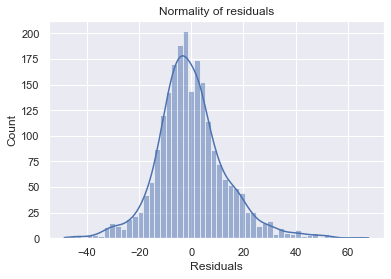

In [162]:
sns.histplot(data=df_pred, x="Residuals", kde=True)
plt.title("Normality of residuals")
plt.show()

* The histogram of residuals does have a bell shape.
Let's check the Q-Q plot.

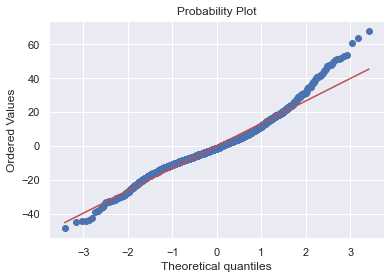

In [163]:
import pylab
import scipy.stats as stats

stats.probplot(df_pred["Residuals"], dist="norm", plot=pylab)
plt.show()

* The residuals more or less follow a straight line except for the upper tail.
Let's check the results of the Shapiro-Wilk test

In [164]:
stats.shapiro(df_pred["Residuals"])

ShapiroResult(statistic=0.9667441248893738, pvalue=2.840687109958905e-22)

* Since p-value < 0.05, the residuals are not normal as per the Shapiro-Wilk test.
* Strictly speaking, the residuals are not normal.
* However, as an approximation, we can accept this distribution as close to being normal.
* <b>So, the assumption is satisfied.</b>

### 3. TEST FOR HOMOSCEDASTICITY

* Testing Homoscedasticity using goldfeldquandt test

In [165]:
import statsmodels.stats.api as sms
from statsmodels.compat import lzip

name = ["F statistic", "p-value"]
test = sms.het_goldfeldquandt(df_pred["Residuals"], x_train4)
lzip(name, test)

[('F statistic', 1.1244260107749613), ('p-value', 0.0256449975330239)]

- The p-value is ~0.82 > 0.05, hence we can say that the residuals have constant variance. 
- <b>Hence we can say that all the assumptions of our linear regression model are satisfied.</b>

### Fitting Linear Regression model on train data set

In [166]:
# predictions on the test set
pred = olsmod2.predict(x_test4)

df_pred_test = pd.DataFrame({"Actual": y_test, "Predicted": pred})
df_pred_test.sample(10, random_state=1)

,Actual,Predicted
63,64.510,80.767
1747,84.600,84.484
818,120.200,104.717
3165,60.180,63.935
2077,78.190,78.182
1030,60.080,55.559
573,30.140,24.561
677,243.405,228.622
3295,101.860,118.937
2737,28.270,29.336


- We can observe here that the model has returned good enough prediction results, and the actual and predicted values are comparable.

- We can also visualize comparison result as a bar graph.

- Note: As the number of records is large, for representation purpose, we are taking a sample of 25 records only.

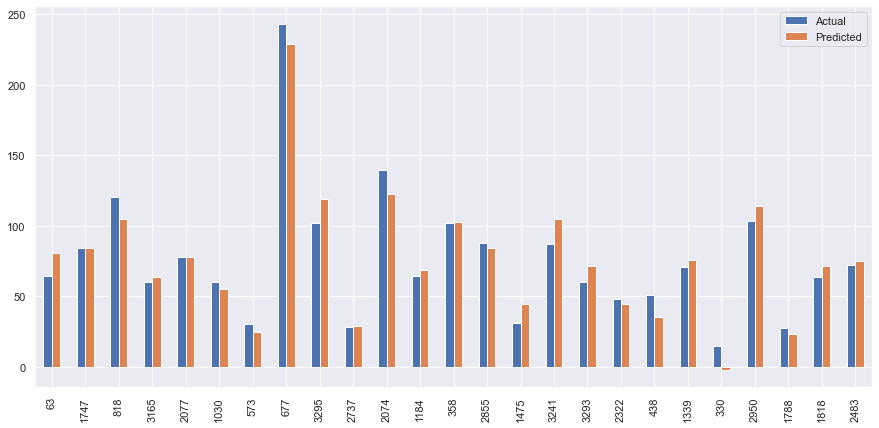

In [167]:
df1 = df_pred_test.sample(25, random_state=1)
df1.plot(kind="bar", figsize=(15, 7))
plt.show()

In [168]:
# checking model performance on train set (seen 70% data)
print("Training Performance\n")
olsmod2_train_perf = model_performance_regression(olsmod2, x_train4, y_train)
olsmod2_train_perf

Training Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,13.466,9.925,0.957,0.957,19.057


In [169]:
# checking model performance on test set (seen 30% data)
print("Test Performance\n")
olsmod2_test_perf = model_performance_regression(olsmod2, x_test4, y_test)
olsmod2_test_perf

Test Performance



,RMSE,MAE,R-squared,Adj. R-squared,MAPE
0,14.099,10.221,0.952,0.952,17.526


The model is able to explain 95.6% of the variation in the data, which is very good.

The train and test RMSE and MAE are  and comparable. So, our model is not suffering from overfitting.

The MAPE on the test set suggests we can predict within 20.7% of the used phone prices.

Hence, we can conclude the model olsmod2 is good for prediction as well as inference purposes.

Let's compare the initial model created with sklearn and the final statsmodels model.

In [170]:
# training performance comparison

models_train_comp_df = pd.concat(
    [linearregression_train_perf.T, olsmod2_train_perf.T],
    axis=1,
)

models_train_comp_df.columns = [
    "Linear Regression sklearn",
    "Linear Regression statsmodels",
]

print("Training performance comparison:")
models_train_comp_df

Training performance comparison:


,Linear Regression sklearn,Linear Regression statsmodels
RMSE,13.393,13.466
MAE,9.833,9.925
R-squared,0.957,0.957
Adj. R-squared,0.957,0.957
MAPE,18.729,19.057


- After comparing the initial model created with sklearn and the final statsmodels model, the statsmodel showed minimal reduction in RMSE and MAE and MAPE, and minimal increment in R^2 and adjusted R^2.

## Final Model Summary

In [171]:
olsmodel_final = sm.OLS(y_train, x_train4).fit()
print(olsmodel_final.summary())

                            OLS Regression Results                            
Dep. Variable:             used_price   R-squared:                       0.957
Model:                            OLS   Adj. R-squared:                  0.957
Method:                 Least Squares   F-statistic:                     7032.
Date:                Sat, 21 Aug 2021   Prob (F-statistic):               0.00
Time:                        09:46:08   Log-Likelihood:                -8954.6
No. Observations:                2228   AIC:                         1.793e+04
Df Residuals:                    2220   BIC:                         1.797e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                       coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------
const               53.5010      1.623  

## Observational summary:

- Shape: 3571 rows, 15 columns: 4 categorical, 11 numerical
- Missing values: 215
    + main_camera_mp : 180
    + selfie_camera_mp : 2
    + int_memory : 10
    + ram : 10
    + battery : 6
    + weight : 7
- Duplicate values:0
- Descriptive data summary
    + The data is about cell phones from 34 different brands, four operating systems. 4g and 5g are binary.
    + Data span is eight years.release_year: 2013 - 2020, eight year data of cell phones.
    + bettery: mean: 3067.225 and median:3000 are quite close. min: 80, max: 12000, big difference, std; ~1364
    + weight: mean: 179.42 and median:159 are quite close. min: 23, max: 950, big difference, big std; ~90.3
    + days_used: mean: 675.4 and median:690 are quite close. min: 91, max:1094 , big difference, big std; 248.64
    + new_price: mean: 237.4 and median:189.8 are quite close. min:9.13 , max: 2560, big difference, big std; 197.55
    + used_price: mean: 109.9 and median:75.53 are quite different. min: 2.51, max: 1916.54, big difference, big std; 121.5
    + In main_camera_mp Minimum 0.080 and maximum is 48 but There is not much difference between mean and median of main_camera_mp, so we can replace the missing values with the mean
    + int_memory : mean is pulled towards the larger extreme may be due to larger outlier.Mininum is very small 0.005, maximum is comparatively larger: 1024, median is 32 and mean is ~84.7, missing values may be replaced by median.
    + ram: mean is 4.057 which is close to median 4, minimum is 0.0300 and maximum is 16. may have some outliers. missing values may be replaced with mean.
    * Cell phones with Two missing values are 8 rows with nokia with no int_memory and ram,
        * the upper two row values and the lower two values are similar: int_memory=32 and ram=4. 
        * Treating missing values of columns int_memory and ram by using following methods:
            - Last Observation Carried Forward (LOCF) for variables int_memory and ram
            - Next Observation Carried Backward (NOCB) for variable battery
- A few questions have been mentioned below which will help you approach the analysis in the right manner and generate insights from the data.
<br><b>**Questions**:</b>

1. What does the distribution of used phone prices look like?<br>
    **Observations**
    * It is the target variable.
    * The distribution of used_price is heavily skewed to the right.
    * The outliers to the right indicate that many cell phones, though used,  have a very high Prices.
    * Mean is 109.9 much greater than median due to extreme values towards higher end.
    * There are a lot of outliers towards right, larger side.Majority of values 50% are between 45 and 126
        
2. What percentage of the used phone market is dominated by Android devices?<br>
    * 90.9% of used phone market is dominated by Android devices.
    * 1.9% Windows, 1.6% iOS and 5.7% other operating system phones.
        - os is ~91% dominated by Android in used phone market. Other operating systems have very small percentage.
        - 4-g technology is present in 66.1% as compared to 33.9% phones with out 4-g.
        - 5-g technology is present only in 4.3% as compared to 95.7% phones with out 5-g.5-g phones could be newer phones
3. The amount of RAM is important for the smooth functioning of a phone. How does the amount of RAM vary with the brand?
    * Brands vary in ram in range 1-6GB or ~4gb ram on average 
4. A large battery often increases a phone's weight, making it feel uncomfortable in the hands. How does the weight vary for phones offering large batteries (more than 4500 mAh)?
    * On average phones with higher battery also have higher weight.
5. Bigger screens are desirable for entertainment purposes as they offer a better viewing experience. How many phones are available across different brands with a screen size larger than 6 inches?
    * Screen size on average are between 6"and 8".
    * There are also some very big screen size present, like blackberry 11"+ and Microsoft 10"+, which may be some error in the data.
6. Budget phones nowadays offer great selfie cameras, allowing us to capture our favorite moments with loved ones. What is the distribution of budget phones offering greater than 8MP selfie cameras across brands?
    * Specifications of selfie_camera_mp > 8mp
    * max is 32mp
    * mean is 18.7mp
    * 50% of these phones have under 16mp
7. Which attributes are highly correlated with the used phone price?

    1. new_price and used_price have high positive correlation; 0.93
    2. used_price has somewhat negative correlation with days_used: -0.47
    * Other significant correlations:
        1. release_year and selfie_camera_mp shows moderately high positive correlation: 0.7
        2. weight and screen_size: 0.63, weight and battery: 0.7
        3. battery and screen size also have high correlation: 0.74
        4. days_used has high negative correlation with selfie_camera_mp: -0.56
8. Consumers cut back on discretionary spending and buy phones only for immediate needs, What percentage of phones comes under budget phone with used_price 500 or less.
    * Majority:92.1% (3289 out of 3571) phones come under the low budget phone: (have price 250 or less)
    * Majority:6.0% (215 out of 3571) phones come under the medium budget phone: (have price 250 or less)
    * Minority:only 1.9% (67 out of 3571) phones come under the high bidget phone: (have price above 500)

## Conclusion:

 

- Linear regression model was used to predict the future price of a used phone from the given data. 
- The model is showing 95.5% accuracy in predicting the used phone prices. 
- The comparison between the predicted price and actual price also shows that the two are on average quite close. 
- This method of predicting the used phone prices will be very helpful for the company and the consumers to predict the future prices of used phones.

- The model is able to explain 95.6% of the variation in the data, which is very good.

- The train and test RMSE and MAE are  and comparable. So, our model is not suffering from overfitting.

- The MAPE on the test set suggests we can predict within 20.7% of the used phone prices.

- Hence, we can conclude the model olsmod2 is good for prediction as well as inference purposes.

- After comparing the initial model created with sklearn and the final statsmodels model, the statsmodel showed minimal reduction in RMSE and MAE and MAPE, but R^2 and adjusted R^2 remained the same. 

#### The final predictor variables for the model are:
   All these variables have probability p<0.05 rejecting the null hypothesis that they are insignificant.
  - 'int_memory': increase in memory increases the used phone price.
  - 'ram': increase in memory increases the used phone price.
  - 'new_price': increase in memory increases the used phone price.
  - 'os_iOS': if phone is having ioS, it increases the used price of phone
  - 'selfie_camera_mp':if phone is having better mp selfie camera, it increases the used price of phone
  - 'days_used': if phone is used for longer time, it decreases the used price of phone
  - 'four_g_yes':if phone is having 4-g technology, it decreases the used price of phone, may be because newer phones have 5-g.
   
  

## Actionable Insights and Recommendations

- 

- Company can check used phones with good conditions for 
    * new_price <= 600
    * ram>=4, 
    * selfie_camera>=8mp
    * days_used is not more than 700, 
    * with at least 4-g technology present.
<br> and then they can sell these phones. 
- Most used cell phones are Android devices, they can put them on deal or  bundle offers to increase sales.
- ioS is mostly in Apple devices which can be sold as a higher end devices due to its durability and higher new_price. 